In [2]:
import numpy as np
import nibabel as nib
import glob
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
from tiffile import imsave
from sklearn.preprocessing import MinMaxScaler
scaler= MinMaxScaler()
import os
import keras.backend as K
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard, ModelCheckpoint
from skimage.util import montage 
import skimage.transform as skTrans
from skimage.transform import rotate
from skimage.transform import resize
from PIL import Image, ImageOps  

In [5]:
t2_list = sorted(glob.glob('D:/brats/BraTS2021_train/*/*t2.nii.gz'))
t1_list = sorted(glob.glob('D:/brats/BraTS2021_train/*/*t1.nii.gz'))
t1ce_list = sorted(glob.glob('D:/brats/BraTS2021_train/*/*t1ce.nii.gz'))
flair_list = sorted(glob.glob('D:/brats/BraTS2021_train/*/*flair.nii.gz'))
mask_list = sorted(glob.glob('D:/brats/BraTS2021_train/*/*seg.nii.gz'))

In [6]:
len(t2_list)

1251

In [8]:
#no
for img in range(len(t2_list)):   
    print("Now preparing image and masks number: ", img)

    image= nib.load(flair_list[img])

    temp_image_flair=nib.load(flair_list[img]).get_fdata()
    temp_image_flair=scaler.fit_transform(temp_image_flair.reshape(-1, temp_image_flair.shape[-1])).reshape(temp_image_flair.shape)

    temp_image_t1=nib.load(t1_list[img]).get_fdata()
    temp_image_t1=scaler.fit_transform(temp_image_t1.reshape(-1, temp_image_t1.shape[-1])).reshape(temp_image_t1.shape)

    temp_image_t1ce=nib.load(t1ce_list[img]).get_fdata()
    temp_image_t1ce=scaler.fit_transform(temp_image_t1ce.reshape(-1, temp_image_t1ce.shape[-1])).reshape(temp_image_t1ce.shape)

    temp_image_t2=nib.load(t2_list[img]).get_fdata()
    temp_image_t2=scaler.fit_transform(temp_image_t2.reshape(-1, temp_image_t2.shape[-1])).reshape(temp_image_t2.shape)
    
    temp_combined_images = np.stack([temp_image_flair, temp_image_t1, temp_image_t1ce, temp_image_t2], axis=3)

    
   
    temp_mask=nib.load(mask_list[img]).get_fdata()
    temp_mask=temp_mask.astype(np.uint8)
    temp_mask[temp_mask==4] = 3  
    temp_mask[temp_mask==1] = 4
    temp_mask[temp_mask==2] = 5
    temp_mask[temp_mask==4] = 2
    temp_mask[temp_mask==5] = 1

    final_mask = nib.Nifti1Image(temp_mask, image.affine)
    final_image = nib.Nifti1Image(temp_combined_images, image.affine)

    nib.save(final_image, 'D:/brats/sample/images/BRATS_'+str(img)+'.nii.gz')
   
    nib.save(final_mask, 'D:/brats/sample/masks/BRATS_'+str(img)+'.nii.gz')
    

    
        



Now preparing image and masks number:  0
Now preparing image and masks number:  1
Now preparing image and masks number:  2


KeyboardInterrupt: 

In [3]:
m_l = os.listdir("D:/brats/train/masks")

In [45]:
for i in range(len(m_l)):
    print("D:/brats/train/masks/"+m_l[i])
    temp=nib.load("D:/brats/train/masks/"+m_l[i])
    temp_mask = temp.get_fdata()
    temp_mask=temp_mask.astype(np.uint8)
    temp_mask[temp_mask==1] = 4
    temp_mask[temp_mask==2] = 5
    temp_mask[temp_mask==4] = 2
    temp_mask[temp_mask==5] = 1
    mask = nib.Nifti1Image(temp_mask, temp.affine)
    nib.save(mask, ("D:/brats/train/masks/"+m_l[i]) )

D:/brats/train/masks/BRATS_0.nii.gz
D:/brats/train/masks/BRATS_1.nii.gz
D:/brats/train/masks/BRATS_10.nii.gz
D:/brats/train/masks/BRATS_100.nii.gz
D:/brats/train/masks/BRATS_1000.nii.gz
D:/brats/train/masks/BRATS_1001.nii.gz
D:/brats/train/masks/BRATS_1002.nii.gz
D:/brats/train/masks/BRATS_1003.nii.gz
D:/brats/train/masks/BRATS_1004.nii.gz
D:/brats/train/masks/BRATS_1005.nii.gz
D:/brats/train/masks/BRATS_1006.nii.gz
D:/brats/train/masks/BRATS_1007.nii.gz
D:/brats/train/masks/BRATS_1008.nii.gz
D:/brats/train/masks/BRATS_1009.nii.gz
D:/brats/train/masks/BRATS_101.nii.gz
D:/brats/train/masks/BRATS_1010.nii.gz
D:/brats/train/masks/BRATS_1011.nii.gz
D:/brats/train/masks/BRATS_1012.nii.gz
D:/brats/train/masks/BRATS_1013.nii.gz
D:/brats/train/masks/BRATS_1014.nii.gz
D:/brats/train/masks/BRATS_1015.nii.gz
D:/brats/train/masks/BRATS_1016.nii.gz
D:/brats/train/masks/BRATS_1017.nii.gz
D:/brats/train/masks/BRATS_1018.nii.gz
D:/brats/train/masks/BRATS_1019.nii.gz
D:/brats/train/masks/BRATS_102.nii.


import splitfolders  

input_folder = 'brats20-dataset-training-validation/BraTS2020_TrainingData/miccai_/'
output_folder = 'brats20-dataset-training-validation/BraTS2020_TrainingData/miccai__/'

splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(.75, .25), group_prefix=None) # default values

In [3]:
import os
import numpy as np


def load_img(img_dir, img_list):
    images=[]
    for i, image_name in enumerate(img_list):    
        if (image_name.split('.')[1] == 'npy'):
            
            image = np.load(img_dir+image_name)
            image = image.reshape((image.shape[0]*image.shape[1]), image.shape[2], image.shape[3])

         
                      
            images.append(image)
    images = np.array(images)
    
    return(images)




def imageLoader(img_dir, img_list, mask_dir, mask_list, batch_size):

    L = len(img_list)

      
    while True:

        batch_start = 0
        batch_end = batch_size

        while batch_start < L:
            limit = min(batch_end, L)
                       
            X = load_img(img_dir, img_list[batch_start:limit])
            Y = load_img(mask_dir, mask_list[batch_start:limit])

            yield (X,Y)      

            batch_start += batch_size   
            batch_end += batch_size

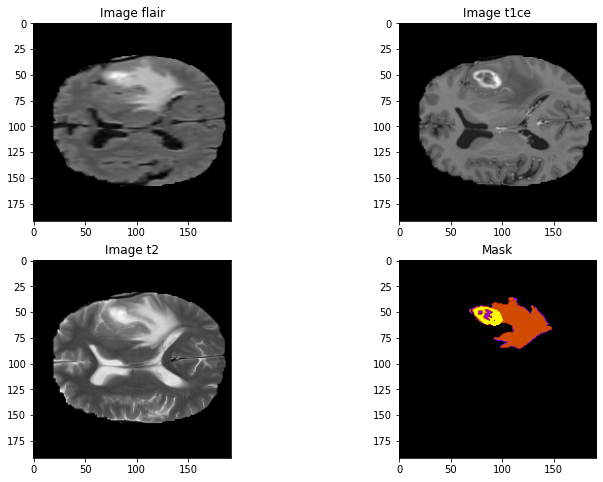

In [4]:
from matplotlib import pyplot as plt
import random

train_img_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/train/images/"
train_mask_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/train/masks/"
train_img_list=os.listdir(train_img_dir)
train_mask_list = os.listdir(train_mask_dir)

batch_size = 20

train_img_datagen = imageLoader(train_img_dir, train_img_list, 
                                train_mask_dir, train_mask_list, batch_size)


img, msk = train_img_datagen.__next__()


img_num = 4
test_img=img[img_num]
test_mask=msk[img_num]
test_mask=test_mask.astype(np.uint16)
test_mask=np.argmax(test_mask, axis=2)
 
n_slice=70
plt.figure(figsize=(12, 8))
test_img = test_img.reshape(192,192,128,3)
test_mask = test_mask.reshape(192,192,128)
plt.subplot(221)
plt.imshow(test_img[:,:,n_slice, 0], cmap='gray')
plt.title('Image flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice, 1], cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice, 2], cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice], cmap='gnuplot')
plt.title('Mask')
plt.show()

In [25]:
import numpy as np
x, y, z = np.ogrid[-10:10:20j, -10:10:20j, -10:10:20j]
s = np.sin(x*y*z)/(x*y*z)
mlab.contour3d(s)

ImportError: Could not import backend for traitsui.  Make sure you
        have a suitable UI toolkit like PyQt/PySide or wxPython
        installed.

In [22]:


from mayavi import mlab
mlab.volume_slice(s, plane_orientation='x_axes', slice_index=10)

ImportError: Could not import backend for traitsui.  Make sure you
        have a suitable UI toolkit like PyQt/PySide or wxPython
        installed.

In [11]:
import new
print(new.__file__)
print(new())

None


TypeError: 'module' object is not callable

(16384, 16384)
(16384, 16384)
(128, 128)


ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (16384, 16384) and arg 2 with shape (128, 128).

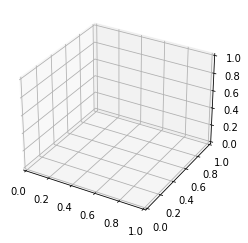

In [7]:
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator
import numpy as np

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
test_mask2 = test_mask[13:141, 13:141, :]
# Make data.
X = test_mask2[0]
Y = test_mask2[1]
X1, Y1 = np.meshgrid(X, Y)
Z = test_mask2[2]
Z1 = X*Y
print(X1.shape)
print(Y1.shape)
print(Z1.shape)

# Plot the surface.
surf = ax.plot_surface(X1, Y1, Z1, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

/tmp/ipykernel_24257/2113630800.py:8: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.



AttributeError: 'numpy.ndarray' object has no attribute 'figure'

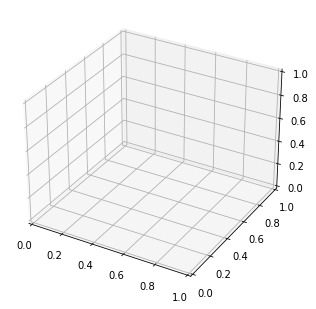

In [104]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# import Dragger3D
from mplot3d_dragger import Dragger3D

fig = plt.figure()
ax = Axes3D(fig)

# ... (your plotting) ...

# wrap your axes with Dragger3D
dr = Dragger3D(test_mask) 
# or for real-time dragging
# dr = Dragger3D(ax, real_time=True)
# but this can be stuttering 
# when you have a lot of objects in one figure

# show()
plt.show()

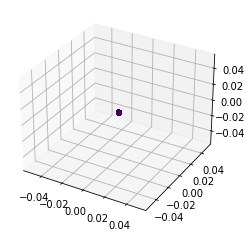

In [107]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
X = test_img[0]
Y = test_img[1]


Z = test_img[2]

ax.scatter(X, Y, Z, c=Y, alpha=1)
plt.show()

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision import models
from torchvision.models.vgg import VGG
from PIL import Image
import numpy as np
import os
import nibabel as nib
import time
import datetime
import torch.nn.functional as F

import matplotlib.pyplot as plt

from tqdm import tqdm

%matplotlib inline

In [6]:
et_indices = np.argwhere(test_mask == 3)
et_xs = [ind[0] for ind in et_indices]
et_ys = [ind[1] for ind in et_indices]
et_zs = [ind[2] for ind in et_indices]

edema_indices = np.argwhere(test_mask == 2)
edema_xs = [ind[0] for ind in edema_indices]
edema_ys = [ind[1] for ind in edema_indices]
edema_zs = [ind[2] for ind in edema_indices]

necrotic_indices = np.argwhere(test_mask == 1)
necrotic_xs = [ind[0] for ind in necrotic_indices]
necrotic_ys = [ind[1] for ind in necrotic_indices]
necrotic_zs = [ind[2] for ind in necrotic_indices]

In [82]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly
import chart_studio

In [83]:
chart_studio.tools.set_credentials_file(username='MartinMa28', api_key='nA5kDovmOVdudM3HaZ1V')

In [91]:
trace = go.Scatter3d(
    x=et_xs,
    y=et_ys,
    z=et_zs,
    mode='markers',
    marker=dict(
        size=3,
        line={'color': 'rgba(25, 57, 57, 0.34)',
             'width': 0.5},
        opacity=0.6)
)
data = [trace]
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3D-Necrotic-tumor')

In [92]:
trace_edema = go.Scatter3d(
    x=edema_xs,
    y=edema_ys,
    z=edema_zs,
    mode='markers',
    marker=dict(size=3,
                line={'color': 'rgba(57, 217, 57, 0.34)',
                     'width': 0.5},
                opacity=0.6)
)

data_edema = [trace_edema]
fig_edema = go.Figure(data=data_edema, layout=layout)
py.iplot(fig, filename='3D-Necrotic-tumor')

In [93]:
trace_necrotc = go.Scatter3d(
    x=necrotic_xs,
    y=necrotic_ys,
    z=necrotic_zs,
    mode='markers',
    marker=dict(size=3,
                line={'color': 'rgba(57, 57, 217, 0.34)',
                     'width': 0.5},
                opacity=0.8)
)

data_necrotic = [trace_necrotc]
fig_necrotic = go.Figure(data=data_necrotic, layout=layout)
py.iplot(fig_necrotic, filename='3D-Necrotic-tumor')

In [94]:
seg_xs = et_xs + edema_xs + necrotic_xs
seg_ys = et_ys + edema_ys + necrotic_ys
seg_zs = et_zs + edema_zs + necrotic_zs
seg_color = [3] * len(et_xs) + [2] * len(edema_xs) + [1] * len(necrotic_xs)

In [95]:
trace_seg = go.Scatter3d(
    x=seg_xs,
    y=seg_ys,
    z=seg_zs,
    mode='markers',
    marker={
        'size': 3,
        'color': seg_color,
        'colorscale': 'Viridis',
        'opacity': 0.8
    }
)
data_seg = [trace_seg]
fig_seg = go.Figure(data=data_seg, layout=layout)
py.iplot(fig_seg, filename='3D-Glioma-segmentation')

PlotlyRequestError: This file is too big! Your current subscription is limited to 524.288 KB uploads. For more information, please visit: https://plotly.com/get-pricing/.

In [7]:
#Reused parameters in all models
import tensorflow as tf
from keras.backend import _preprocess_padding, _preprocess_conv3d_input
import segmentation_models_3D as sm
n_classes=4
activation='softmax'

LR = 0.0001
optim = tf.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (car: 1.; pedestrian: 2.; background: 0.5;)
dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.25, 0.25, 0.25, 0.25])) 
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]



Segmentation Models: using `tf.keras` framework.


In [8]:
train_img_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/train/images/"
train_mask_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/train/masks/"

val_img_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/"
val_mask_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/"

train_img_list=os.listdir(train_img_dir)
train_mask_list = os.listdir(train_mask_dir)

val_img_list=os.listdir(val_img_dir)
val_mask_list = os.listdir(val_mask_dir)


(2, 36864, 128, 3)


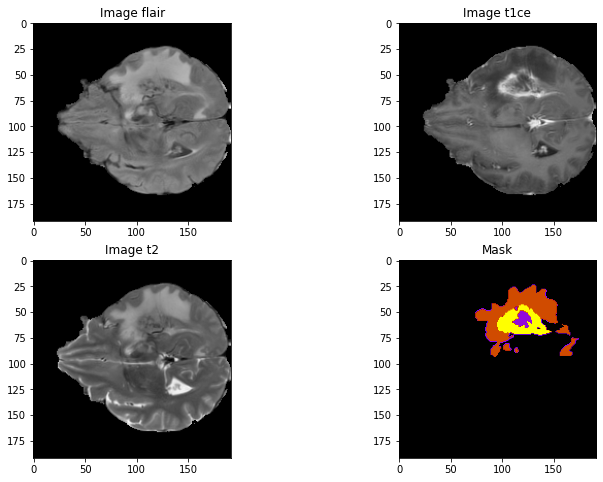

In [9]:
batch_size = 2

train_img_datagen = imageLoader(train_img_dir, train_img_list, 
                                train_mask_dir, train_mask_list, batch_size)

val_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

img, msk = train_img_datagen.__next__()
img1, msk1 = val_img_datagen.__next__()
print(img.shape)
img_num = random.randint(0,img.shape[0]-1)
test_img=img[img_num]
test_mask=msk[img_num]
test_mask=np.argmax(test_mask, axis=2)
 
n_slice=50
plt.figure(figsize=(12, 8))
test_img = test_img.reshape(192,192,128,3)
test_mask = test_mask.reshape(192,192,128)
plt.subplot(221)
plt.imshow(test_img[:,:,n_slice, 0], cmap='gray')
plt.title('Image flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice, 1], cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice, 2], cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice], cmap ='gnuplot')
plt.title('Mask')
plt.show()

In [10]:
# dice loss as defined above for 4 classes
def dice_coef(test_mask, test_prediction, smooth=1.0):
    class_num = 4
    for i in range(class_num):
        test_mask_f = K.flatten(test_mask[:,:,:,i])
        test_prediction_f = K.flatten(test_prediction[:,:,:,i])
        intersection = K.sum(test_mask_f * test_prediction_f)
        loss = ((2. * intersection + smooth) / (K.sum(test_mask_f) + K.sum(test_prediction_f) + smooth))
   #     K.print_tensor(loss, message='loss value for class {} : '.format(SEGMENT_CLASSES[i]))
        if i == 0:
            total_loss = loss
        else:
            total_loss = total_loss + loss
    total_loss = total_loss / class_num
#    K.print_tensor(total_loss, message=' total dice coef: ')
    return total_loss


 
# define per class evaluation of dice coef
# inspired by https://github.com/keras-team/keras/issues/9395
def dice_coef_TC(test_mask, test_prediction, epsilon=1e-6):
    intersection = K.sum(K.abs(test_mask[:,:,:,1] * test_prediction[:,:,:,1]))
    return (2. * intersection) / (K.sum(K.square(test_mask[:,:,:,1])) + K.sum(K.square(test_prediction[:,:,:,1])) + epsilon)

def dice_coef_WT(test_mask, test_prediction, epsilon=1e-6):
    intersection = K.sum(K.abs(test_mask[:,:,:,2] * test_prediction[:,:,:,2]))
    return (2. * intersection) / (K.sum(K.square(test_mask[:,:,:,2])) + K.sum(K.square(test_prediction[:,:,:,2])) + epsilon)

def dice_coef_ET(test_mask, test_prediction, epsilon=1e-6):
    intersection = K.sum(K.abs(test_mask[:,:,:,3] * test_prediction[:,:,:,3]))
    return (2. * intersection) / (K.sum(K.square(test_mask[:,:,:,3])) + K.sum(K.square(test_prediction[:,:,:,3])) + epsilon)



# Computing Precision 
def precision(test_mask, test_prediction):
        true_positives = K.sum(K.round(K.clip(test_mask * test_prediction, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(test_prediction, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision
def precision_TC(test_mask, test_prediction):
    true_positives = K.sum(K.round(K.clip(test_mask[:,:,:,1] * test_prediction[:,:,:,1], 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(test_prediction[:,:,:,1], 0, 1)))
    precision_TC = true_positives / (predicted_positives + K.epsilon())
    return precision_TC
def precision_WT(test_mask, test_prediction):
    true_positives = K.sum(K.round(K.clip(test_mask[:,:,:,2] * test_prediction[:,:,:,2], 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(test_prediction[:,:,:,2], 0, 1)))
    precision_TC = true_positives / (predicted_positives + K.epsilon())
    return precision_TC
def precision_ET(test_mask, test_prediction):
    true_positives = K.sum(K.round(K.clip(test_mask[:,:,:,3] * test_prediction[:,:,:,3], 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(test_prediction[:,:,:,3], 0, 1)))
    precision_TC = true_positives / (predicted_positives + K.epsilon())
    return precision_TC

    
# Computing Sensitivity      
def sensitivity(test_mask, test_prediction):
    true_positives = K.sum(K.round(K.clip(test_mask * test_prediction, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(test_mask, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())
def sensitivity_TC(test_mask, test_prediction):
    true_positives = K.sum(K.round(K.clip(test_mask[:,:,:,1] * test_prediction[:,:,:,1], 0, 1)))
    possible_positives = K.sum(K.round(K.clip(test_mask[:,:,:,1], 0, 1)))
    return true_positives / (possible_positives + K.epsilon())
def sensitivity_WT(test_mask, test_prediction):
    true_positives = K.sum(K.round(K.clip(test_mask[:,:,:,2] * test_prediction[:,:,:,2], 0, 1)))
    possible_positives = K.sum(K.round(K.clip(test_mask[:,:,:,2], 0, 1)))
    return true_positives / (possible_positives + K.epsilon())
def sensitivity_ET(test_mask, test_prediction):
    true_positives = K.sum(K.round(K.clip(test_mask[:,:,:,3] * test_prediction[:,:,:,3], 0, 1)))
    possible_positives = K.sum(K.round(K.clip(test_mask[:,:,:,3], 0, 1)))
    return true_positives / (possible_positives + K.epsilon())

# Computing Specificity
def specificity(test_mask, test_prediction):
    true_negatives = K.sum(K.round(K.clip((1-test_mask) * (1-test_prediction), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-test_mask, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())
def specificity_TC(test_mask, test_prediction):
    true_negatives = K.sum(K.round(K.clip((1-test_mask[:,:,:,1]) * (1-test_prediction[:,:,:,1]), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-test_mask[:,:,:,1], 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())
def specificity_WT(test_mask, test_prediction):
    true_negatives = K.sum(K.round(K.clip((1-test_mask[:,:,:,2]) * (1-test_prediction[:,:,:,2]), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-test_mask[:,:,:,2], 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())
def specificity_ET(test_mask, test_prediction):
    true_negatives = K.sum(K.round(K.clip((1-test_mask[:,:,:,3]) * (1-test_prediction[:,:,:,3]), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-test_mask[:,:,:,3], 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

In [18]:
BACKBONE1 = 'efficientnetb1'
import segmentation_models as sm

sm.set_framework('tf.keras')

sm.framework()
model1 = sm.Unet(BACKBONE1, encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model1.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
              metrics = ['accuracy',sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), dice_coef, dice_coef_TC, dice_coef_WT ,dice_coef_ET, precision,precision_TC, precision_WT, precision_ET, sensitivity, sensitivity_TC,sensitivity_WT,sensitivity_ET,specificity, specificity_TC, specificity_WT, specificity_ET] )
#model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)

print(model1.summary())
tensorboard = TensorBoard(log_dir = 'logs')
checkpoint = ModelCheckpoint("diceall_6june.h5",monitor="val_accuracy",save_best_only=True,mode="auto",verbose=1)
reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.5, patience = 0, min_delta = 0.001,
                              mode='auto',verbose=1,)

27164032/27164032 [==============================] - 12s 0us/step
Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 stem_conv (Conv2D)             (None, None, None,   864         ['input_7[0][0]']                
                                32)                                                               
                                                                                                  
 stem_bn (BatchNormalization)   (None, None, None,   128         ['stem_conv[0][0]']              
                         

 block2a_expand_activation (Act  (None, None, None,   0          ['block2a_expand_bn[0][0]']      
 ivation)                       96)                                                               
                                                                                                  
 block2a_dwconv (DepthwiseConv2  (None, None, None,   864        ['block2a_expand_activation[0][0]
 D)                             96)                              ']                               
                                                                                                  
 block2a_bn (BatchNormalization  (None, None, None,   384        ['block2a_dwconv[0][0]']         
 )                              96)                                                               
                                                                                                  
 block2a_activation (Activation  (None, None, None,   0          ['block2a_bn[0][0]']             
 )        

                                                                                                  
 block2c_bn (BatchNormalization  (None, None, None,   576        ['block2c_dwconv[0][0]']         
 )                              144)                                                              
                                                                                                  
 block2c_activation (Activation  (None, None, None,   0          ['block2c_bn[0][0]']             
 )                              144)                                                              
                                                                                                  
 block2c_se_squeeze (GlobalAver  (None, 144)         0           ['block2c_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block2c_s

 )                              240)                                                              
                                                                                                  
 block3b_se_squeeze (GlobalAver  (None, 240)         0           ['block3b_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block3b_se_reshape (Reshape)   (None, 1, 1, 240)    0           ['block3b_se_squeeze[0][0]']     
                                                                                                  
 block3b_se_reduce (Conv2D)     (None, 1, 1, 10)     2410        ['block3b_se_reshape[0][0]']     
                                                                                                  
 block3b_se_expand (Conv2D)     (None, 1, 1, 240)    2640        ['block3b_se_reduce[0][0]']      
          

 block4a_activation (Activation  (None, None, None,   0          ['block4a_bn[0][0]']             
 )                              240)                                                              
                                                                                                  
 block4a_se_squeeze (GlobalAver  (None, 240)         0           ['block4a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block4a_se_reshape (Reshape)   (None, 1, 1, 240)    0           ['block4a_se_squeeze[0][0]']     
                                                                                                  
 block4a_se_reduce (Conv2D)     (None, 1, 1, 10)     2410        ['block4a_se_reshape[0][0]']     
                                                                                                  
 block4a_s

                                                                                                  
 block4c_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block4c_se_squeeze[0][0]']     
                                                                                                  
 block4c_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block4c_se_reshape[0][0]']     
                                                                                                  
 block4c_se_expand (Conv2D)     (None, 1, 1, 480)    10080       ['block4c_se_reduce[0][0]']      
                                                                                                  
 block4c_se_excite (Multiply)   (None, None, None,   0           ['block4c_activation[0][0]',     
                                480)                              'block4c_se_expand[0][0]']      
                                                                                                  
 block4c_p

 agePooling2D)                                                                                    
                                                                                                  
 block5a_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block5a_se_squeeze[0][0]']     
                                                                                                  
 block5a_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block5a_se_reshape[0][0]']     
                                                                                                  
 block5a_se_expand (Conv2D)     (None, 1, 1, 480)    10080       ['block5a_se_reduce[0][0]']      
                                                                                                  
 block5a_se_excite (Multiply)   (None, None, None,   0           ['block5a_activation[0][0]',     
                                480)                              'block5a_se_expand[0][0]']      
          

                                                                                                  
 block5c_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block5c_se_reduce[0][0]']      
                                                                                                  
 block5c_se_excite (Multiply)   (None, None, None,   0           ['block5c_activation[0][0]',     
                                672)                              'block5c_se_expand[0][0]']      
                                                                                                  
 block5c_project_conv (Conv2D)  (None, None, None,   75264       ['block5c_se_excite[0][0]']      
                                112)                                                              
                                                                                                  
 block5c_project_bn (BatchNorma  (None, None, None,   448        ['block5c_project_conv[0][0]']   
 lization)

 block6a_se_reduce (Conv2D)     (None, 1, 1, 28)     18844       ['block6a_se_reshape[0][0]']     
                                                                                                  
 block6a_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block6a_se_reduce[0][0]']      
                                                                                                  
 block6a_se_excite (Multiply)   (None, None, None,   0           ['block6a_activation[0][0]',     
                                672)                              'block6a_se_expand[0][0]']      
                                                                                                  
 block6a_project_conv (Conv2D)  (None, None, None,   129024      ['block6a_se_excite[0][0]']      
                                192)                                                              
                                                                                                  
 block6a_p

                                1152)                             'block6c_se_expand[0][0]']      
                                                                                                  
 block6c_project_conv (Conv2D)  (None, None, None,   221184      ['block6c_se_excite[0][0]']      
                                192)                                                              
                                                                                                  
 block6c_project_bn (BatchNorma  (None, None, None,   768        ['block6c_project_conv[0][0]']   
 lization)                      192)                                                              
                                                                                                  
 block6c_drop (FixedDropout)    (None, None, None,   0           ['block6c_project_bn[0][0]']     
                                192)                                                              
          

 block6e_se_excite (Multiply)   (None, None, None,   0           ['block6e_activation[0][0]',     
                                1152)                             'block6e_se_expand[0][0]']      
                                                                                                  
 block6e_project_conv (Conv2D)  (None, None, None,   221184      ['block6e_se_excite[0][0]']      
                                192)                                                              
                                                                                                  
 block6e_project_bn (BatchNorma  (None, None, None,   768        ['block6e_project_conv[0][0]']   
 lization)                      192)                                                              
                                                                                                  
 block6e_drop (FixedDropout)    (None, None, None,   0           ['block6e_project_bn[0][0]']     
          

                                                                                                  
 block7b_project_bn (BatchNorma  (None, None, None,   1280       ['block7b_project_conv[0][0]']   
 lization)                      320)                                                              
                                                                                                  
 block7b_drop (FixedDropout)    (None, None, None,   0           ['block7b_project_bn[0][0]']     
                                320)                                                              
                                                                                                  
 block7b_add (Add)              (None, None, None,   0           ['block7b_drop[0][0]',           
                                320)                              'block7a_project_bn[0][0]']     
                                                                                                  
 top_conv 

 lization)                      64)                                                               
                                                                                                  
 decoder_stage2a_relu (Activati  (None, None, None,   0          ['decoder_stage2a_bn[0][0]']     
 on)                            64)                                                               
                                                                                                  
 decoder_stage2b_conv (Conv2D)  (None, None, None,   36864       ['decoder_stage2a_relu[0][0]']   
                                64)                                                               
                                                                                                  
 decoder_stage2b_bn (BatchNorma  (None, None, None,   256        ['decoder_stage2b_conv[0][0]']   
 lization)                      64)                                                               
          

In [10]:
from keras.models import load_model

#Load model for prediction or continue training

#For continuing training....
#The following gives an error: Unknown loss function: dice_loss_plus_1focal_loss
#This is because the model does not save loss function and metrics. So to compile and 
#continue training we need to provide these as custom_objects.
#my_model = load_model('Seg_BraTS_3d.hdf5')

#So let us add the loss as custom object... but the following throws another error...
#Unknown metric function: iou_score
#my_model = load_model('saved_models/brats_3d_100epochs_simple_unet_weighted_dice.hdf5', 
                     # custom_objects={'dice_loss_plus_1focal_loss': total_loss})

#Now, let us add the iou_score function we used during our initial training
model = load_model('jul26.h5',custom_objects={'dice_loss_plus_1focal_loss': total_loss,
                                                      'iou_score':sm.metrics.IOUScore(threshold=0.5),
                                                      'dice_coef': dice_coef,
                                                      'dice_coef_TC': dice_coef_TC,
                                                      'dice_coef_WT': dice_coef_WT ,
                                                      'dice_coef_ET':dice_coef_ET,
                                                      'precision': precision,
                                                      'precision_TC': precision_TC,
                                                      'precision_WT': precision_WT,
                                                      'precision_ET': precision_ET,
                                                      'sensitivity': sensitivity,
                                                      'sensitivity_TC': sensitivity_TC,
                                                      'sensitivity_WT': sensitivity_WT,
                                                      'sensitivity_ET': sensitivity_ET,
                                                      'specificity': specificity,
                                                      'specificity_TC': specificity_TC,
                                                      'specificity_WT': specificity_WT,
                                                      'specificity_ET': specificity_ET,
                                                      'f1-score':sm.metrics.FScore(threshold=0.5)
                                                     })


In [11]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


2022-10-15 16:51:12.873348: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6039797760 exceeds 10% of free system memory.


1/1 [==============================] - 19s 19s/step
Mean IoU = 0.67993754


In [14]:
steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size
#Now all set to continue the training process. 
history2=model.fit(train_img_datagen,steps_per_epoch=steps_per_epoch,epochs=10,  verbose=1, validation_data=val_img_datagen,validation_steps=val_steps_per_epoch, callbacks=[tensorboard,checkpoint,reduce_lr])

Epoch 1/10


2022-07-14 19:40:05.079875: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 5435817984 exceeds 10% of free system memory.
2022-07-14 19:40:05.079905: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 5435817984 exceeds 10% of free system memory.
2022-07-14 19:40:09.378416: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.
2022-07-14 19:40:09.378443: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.


  1/138 [..............................] - ETA: 1:23:38 - loss: 0.0144 - accuracy: 0.9952 - iou_score: 0.6673 - f1-score: 0.7854 - dice_coef: 0.7181 - dice_coef_TC: 0.7240 - dice_coef_WT: 0.7543 - dice_coef_ET: 0.8107 - precision: 0.9960 - precision_TC: 0.6680 - precision_WT: 0.7004 - precision_ET: 0.9663 - sensitivity: 0.9946 - sensitivity_TC: 0.6697 - sensitivity_WT: 0.7112 - sensitivity_ET: 0.6373 - specificity: 0.9987 - specificity_TC: 0.9987 - specificity_WT: 0.9987 - specificity_ET: 0.9999

2022-07-14 19:40:36.981121: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 5435817984 exceeds 10% of free system memory.


138/138 [==============================] - ETA: 0s - loss: 0.0156 - accuracy: 0.9944 - iou_score: 0.7197 - f1-score: 0.8175 - dice_coef: 0.7380 - dice_coef_TC: 0.7630 - dice_coef_WT: 0.8357 - dice_coef_ET: 0.7882 - precision: 0.9954 - precision_TC: 0.8076 - precision_WT: 0.8301 - precision_ET: 0.7808 - sensitivity: 0.9936 - sensitivity_TC: 0.6763 - sensitivity_WT: 0.7800 - sensitivity_ET: 0.7550 - specificity: 0.9985 - specificity_TC: 0.9994 - specificity_WT: 0.9984 - specificity_ET: 0.9994 
Epoch 1: val_accuracy improved from -inf to 0.99261, saving model to diceall_6june.h5
138/138 [==============================] - 4798s 35s/step - loss: 0.0156 - accuracy: 0.9944 - iou_score: 0.7197 - f1-score: 0.8175 - dice_coef: 0.7380 - dice_coef_TC: 0.7630 - dice_coef_WT: 0.8357 - dice_coef_ET: 0.7882 - precision: 0.9954 - precision_TC: 0.8076 - precision_WT: 0.8301 - precision_ET: 0.7808 - sensitivity: 0.9936 - sensitivity_TC: 0.6763 - sensitivity_WT: 0.7800 - sensitivity_ET: 0.7550 - specifici

Epoch 6/10
138/138 [==============================] - ETA: 0s - loss: 0.0156 - accuracy: 0.9944 - iou_score: 0.7201 - f1-score: 0.8179 - dice_coef: 0.7384 - dice_coef_TC: 0.7644 - dice_coef_WT: 0.8359 - dice_coef_ET: 0.7887 - precision: 0.9954 - precision_TC: 0.8085 - precision_WT: 0.8315 - precision_ET: 0.7811 - sensitivity: 0.9937 - sensitivity_TC: 0.6784 - sensitivity_WT: 0.7791 - sensitivity_ET: 0.7551 - specificity: 0.9985 - specificity_TC: 0.9994 - specificity_WT: 0.9984 - specificity_ET: 0.9994 
Epoch 6: val_accuracy did not improve from 0.99261

Epoch 6: ReduceLROnPlateau reducing learning rate to 7.629394893626795e-09.
138/138 [==============================] - 4843s 35s/step - loss: 0.0156 - accuracy: 0.9944 - iou_score: 0.7201 - f1-score: 0.8179 - dice_coef: 0.7384 - dice_coef_TC: 0.7644 - dice_coef_WT: 0.8359 - dice_coef_ET: 0.7887 - precision: 0.9954 - precision_TC: 0.8085 - precision_WT: 0.8315 - precision_ET: 0.7811 - sensitivity: 0.9937 - sensitivity_TC: 0.6784 - sensit

In [15]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


Mean IoU = 0.68012506


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)
1/1 [==============================] - 2s 2s/step


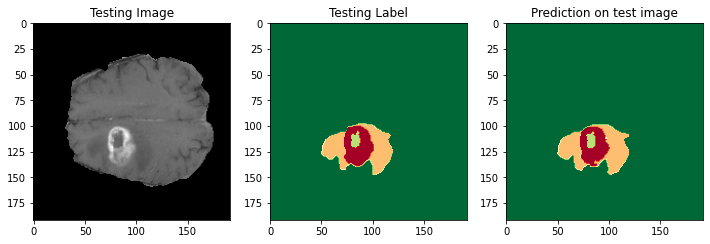

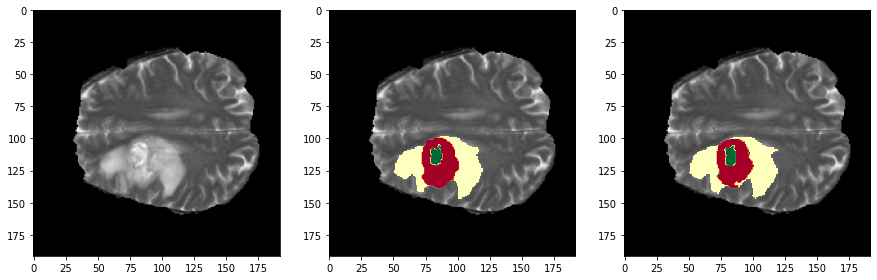

In [12]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 173

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))
n_slice = 85
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 85
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice], cmap='RdYlGn_r')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice], cmap='RdYlGn_r')
plt.show()



# Skip 50:-50 slices since there is not much to see
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,2], cmap = 'gray')
ax2.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)

fig.savefig("first.png")








In [ ]:
plt.figure('Brain segmentation')
plt.subplot(1,1,1).set_axis_off()
plt.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
plt.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
plt.savefig("first3.png")

In [12]:
from keras.models import load_model

#Load model for prediction or continue training

#For continuing training....
#The following gives an error: Unknown loss function: dice_loss_plus_1focal_loss
#This is because the model does not save loss function and metrics. So to compile and 
#continue training we need to provide these as custom_objects.
#my_model = load_model('Seg_BraTS_3d.hdf5')

#So let us add the loss as custom object... but the following throws another error...
#Unknown metric function: iou_score
#my_model = load_model('saved_models/brats_3d_100epochs_simple_unet_weighted_dice.hdf5', 
                     # custom_objects={'dice_loss_plus_1focal_loss': total_loss})

#Now, let us add the iou_score function we used during our initial training
model = load_model('diceall_6june.h5',custom_objects={'dice_loss_plus_1focal_loss': total_loss,
                                                      'iou_score':sm.metrics.IOUScore(threshold=0.5),
                                                      'dice_coef': dice_coef,
                                                      'dice_coef_TC': dice_coef_TC,
                                                      'dice_coef_WT': dice_coef_WT ,
                                                      'dice_coef_ET':dice_coef_ET,
                                                      'precision': precision,
                                                      'precision_TC': precision_TC,
                                                      'precision_WT': precision_WT,
                                                      'precision_ET': precision_ET,
                                                      'sensitivity': sensitivity,
                                                      'sensitivity_TC': sensitivity_TC,
                                                      'sensitivity_WT': sensitivity_WT,
                                                      'sensitivity_ET': sensitivity_ET,
                                                      'specificity': specificity,
                                                      'specificity_TC': specificity_TC,
                                                      'specificity_WT': specificity_WT,
                                                      'specificity_ET': specificity_ET,
                                                      'f1-score':sm.metrics.FScore(threshold=0.5)
                                                     })




In [13]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


2022-07-26 15:53:07.511416: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6039797760 exceeds 10% of free system memory.


Mean IoU = 0.67996895


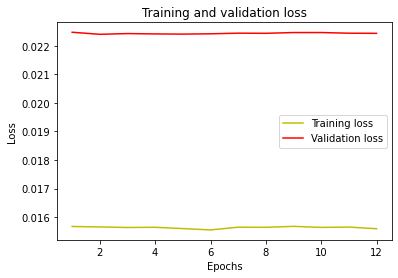

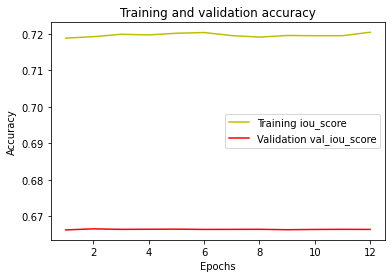

In [11]:
loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

iou_score = history2.history['iou_score']
val_iou_score = history2.history['val_iou_score']

plt.plot(epochs, iou_score, 'y', label='Training iou_score')
plt.plot(epochs, val_iou_score, 'r', label='Validation val_iou_score')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


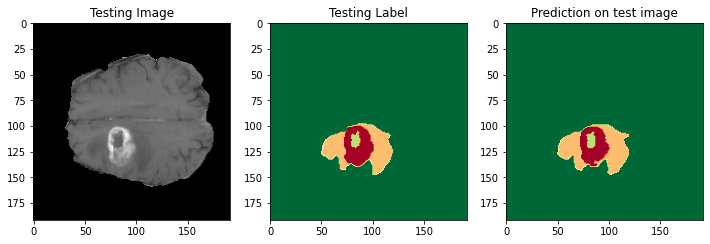

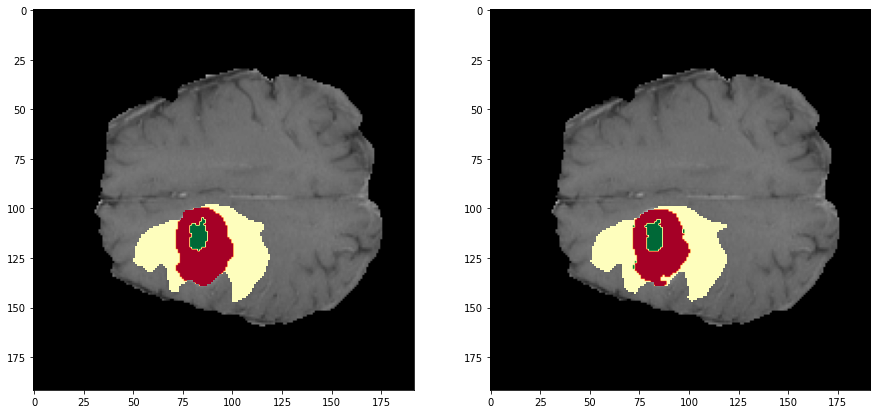

In [14]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 173

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 85
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice], cmap='RdYlGn_r')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice], cmap='RdYlGn_r')
plt.show()
fig.savefig('result14june.png')

# Skip 50:-50 slices since there is not much to see
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax1.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax2.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
fig.savefig('resultll14june.png')

In [129]:
from keras.models import load_model

#Load model for prediction or continue training

#For continuing training....
#The following gives an error: Unknown loss function: dice_loss_plus_1focal_loss
#This is because the model does not save loss function and metrics. So to compile and 
#continue training we need to provide these as custom_objects.
#my_model = load_model('Seg_BraTS_3d.hdf5')

#So let us add the loss as custom object... but the following throws another error...
#Unknown metric function: iou_score
#my_model = load_model('saved_models/brats_3d_100epochs_simple_unet_weighted_dice.hdf5', 
                     # custom_objects={'dice_loss_plus_1focal_loss': total_loss})

#Now, let us add the iou_score function we used during our initial training
model = load_model('diceall_6june.h5',custom_objects={'dice_loss_plus_1focal_loss': total_loss,
                                                      'iou_score':sm.metrics.IOUScore(threshold=0.5),
                                                      'dice_coef': dice_coef,
                                                      'dice_coef_TC': dice_coef_TC,
                                                      'dice_coef_WT': dice_coef_WT ,
                                                      'dice_coef_ET':dice_coef_ET,
                                                      'precision': precision,
                                                      'precision_TC': precision_TC,
                                                      'precision_WT': precision_WT,
                                                      'precision_ET': precision_ET,
                                                      'sensitivity': sensitivity,
                                                      'sensitivity_TC': sensitivity_TC,
                                                      'sensitivity_WT': sensitivity_WT,
                                                      'sensitivity_ET': sensitivity_ET,
                                                      'specificity': specificity,
                                                      'specificity_TC': specificity_TC,
                                                      'specificity_WT': specificity_WT,
                                                      'specificity_ET': specificity_ET,
                                                      'f1-score':sm.metrics.FScore(threshold=0.5)
                                                     })



steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size
#Now all set to continue the training process. 
history2=model.fit(train_img_datagen,steps_per_epoch=steps_per_epoch,epochs=12,  verbose=1, validation_data=val_img_datagen,validation_steps=val_steps_per_epoch, callbacks=[tensorboard,checkpoint,reduce_lr])

Epoch 1/12
138/138 [==============================] - ETA: 0s - loss: 0.0157 - accuracy: 0.9944 - iou_score: 0.7189 - f1-score: 0.8168 - dice_coef: 0.7373 - dice_coef_TC: 0.7613 - dice_coef_WT: 0.8350 - dice_coef_ET: 0.7880 - precision: 0.9953 - precision_TC: 0.8163 - precision_WT: 0.8270 - precision_ET: 0.7816 - sensitivity: 0.9936 - sensitivity_TC: 0.6683 - sensitivity_WT: 0.7818 - sensitivity_ET: 0.7533 - specificity: 0.9984 - specificity_TC: 0.9994 - specificity_WT: 0.9983 - specificity_ET: 0.9994 
Epoch 1: val_accuracy did not improve from 0.99449
138/138 [==============================] - 4538s 33s/step - loss: 0.0157 - accuracy: 0.9944 - iou_score: 0.7189 - f1-score: 0.8168 - dice_coef: 0.7373 - dice_coef_TC: 0.7613 - dice_coef_WT: 0.8350 - dice_coef_ET: 0.7880 - precision: 0.9953 - precision_TC: 0.8163 - precision_WT: 0.8270 - precision_ET: 0.7816 - sensitivity: 0.9936 - sensitivity_TC: 0.6683 - sensitivity_WT: 0.7818 - sensitivity_ET: 0.7533 - specificity: 0.9984 - specificity

Epoch 6/12
138/138 [==============================] - ETA: 0s - loss: 0.0156 - accuracy: 0.9944 - iou_score: 0.7199 - f1-score: 0.8178 - dice_coef: 0.7383 - dice_coef_TC: 0.7644 - dice_coef_WT: 0.8358 - dice_coef_ET: 0.7879 - precision: 0.9954 - precision_TC: 0.8122 - precision_WT: 0.8307 - precision_ET: 0.7799 - sensitivity: 0.9936 - sensitivity_TC: 0.6769 - sensitivity_WT: 0.7793 - sensitivity_ET: 0.7541 - specificity: 0.9985 - specificity_TC: 0.9994 - specificity_WT: 0.9984 - specificity_ET: 0.9994 
Epoch 6: val_accuracy did not improve from 0.99449

Epoch 6: ReduceLROnPlateau reducing learning rate to 6.103515914901436e-08.
138/138 [==============================] - 4549s 33s/step - loss: 0.0156 - accuracy: 0.9944 - iou_score: 0.7199 - f1-score: 0.8178 - dice_coef: 0.7383 - dice_coef_TC: 0.7644 - dice_coef_WT: 0.8358 - dice_coef_ET: 0.7879 - precision: 0.9954 - precision_TC: 0.8122 - precision_WT: 0.8307 - precision_ET: 0.7799 - sensitivity: 0.9936 - sensitivity_TC: 0.6769 - sensit

Epoch 11/12
138/138 [==============================] - ETA: 0s - loss: 0.0156 - accuracy: 0.9944 - iou_score: 0.7202 - f1-score: 0.8179 - dice_coef: 0.7385 - dice_coef_TC: 0.7636 - dice_coef_WT: 0.8362 - dice_coef_ET: 0.7890 - precision: 0.9954 - precision_TC: 0.8110 - precision_WT: 0.8302 - precision_ET: 0.7812 - sensitivity: 0.9937 - sensitivity_TC: 0.6752 - sensitivity_WT: 0.7809 - sensitivity_ET: 0.7551 - specificity: 0.9985 - specificity_TC: 0.9994 - specificity_WT: 0.9984 - specificity_ET: 0.9994 
Epoch 11: val_accuracy did not improve from 0.99449

Epoch 11: ReduceLROnPlateau reducing learning rate to 1.907348723406699e-09.
138/138 [==============================] - 4590s 33s/step - loss: 0.0156 - accuracy: 0.9944 - iou_score: 0.7202 - f1-score: 0.8179 - dice_coef: 0.7385 - dice_coef_TC: 0.7636 - dice_coef_WT: 0.8362 - dice_coef_ET: 0.7890 - precision: 0.9954 - precision_TC: 0.8110 - precision_WT: 0.8302 - precision_ET: 0.7812 - sensitivity: 0.9937 - sensitivity_TC: 0.6752 - sen

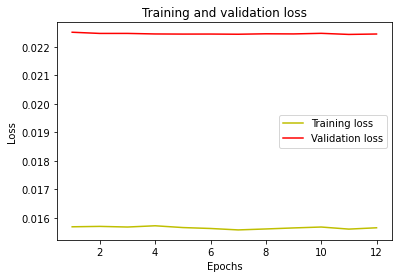

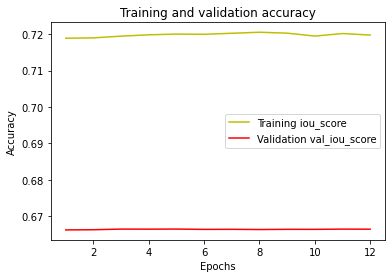

In [130]:
loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

iou_score = history2.history['iou_score']
val_iou_score = history2.history['val_iou_score']

plt.plot(epochs, iou_score, 'y', label='Training iou_score')
plt.plot(epochs, val_iou_score, 'r', label='Validation val_iou_score')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [131]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())



Mean IoU = 0.6797859


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


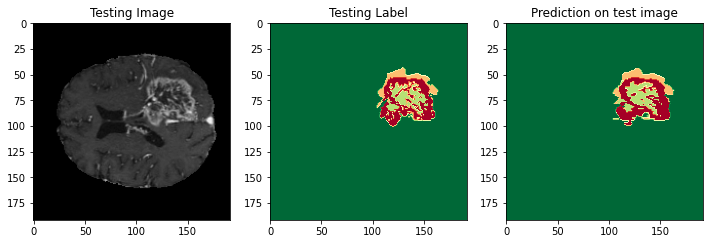

In [21]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 44

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 70
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice], cmap='RdYlGn_r')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice], cmap='RdYlGn_r')
plt.show()
fig.savefig('result10june.png')

In [46]:
from keras.models import load_model

#Load model for prediction or continue training

#For continuing training....
#The following gives an error: Unknown loss function: dice_loss_plus_1focal_loss
#This is because the model does not save loss function and metrics. So to compile and 
#continue training we need to provide these as custom_objects.
#my_model = load_model('Seg_BraTS_3d.hdf5')

#So let us add the loss as custom object... but the following throws another error...
#Unknown metric function: iou_score
#my_model = load_model('saved_models/brats_3d_100epochs_simple_unet_weighted_dice.hdf5', 
                     # custom_objects={'dice_loss_plus_1focal_loss': total_loss})

#Now, let us add the iou_score function we used during our initial training
model = load_model('diceall_6june.h5',custom_objects={'dice_loss_plus_1focal_loss': total_loss,
                                                      'iou_score':sm.metrics.IOUScore(threshold=0.5),
                                                      'dice_coef': dice_coef,
                                                      'dice_coef_TC': dice_coef_TC,
                                                      'dice_coef_WT': dice_coef_WT ,
                                                      'dice_coef_ET':dice_coef_ET,
                                                      'precision': precision,
                                                      'precision_TC': precision_TC,
                                                      'precision_WT': precision_WT,
                                                      'precision_ET': precision_ET,
                                                      'sensitivity': sensitivity,
                                                      'sensitivity_TC': sensitivity_TC,
                                                      'sensitivity_WT': sensitivity_WT,
                                                      'sensitivity_ET': sensitivity_ET,
                                                      'specificity': specificity,
                                                      'specificity_TC': specificity_TC,
                                                      'specificity_WT': specificity_WT,
                                                      'specificity_ET': specificity_ET,
                                                      'f1-score':sm.metrics.FScore(threshold=0.5)
                                                     })


steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size
#Now all set to continue the training process. 
history2=model.fit(train_img_datagen,steps_per_epoch=steps_per_epoch,epochs=10,  verbose=1, validation_data=val_img_datagen,validation_steps=val_steps_per_epoch, callbacks=[tensorboard,checkpoint,reduce_lr])

Epoch 1/10


2022-06-09 19:27:32.648180: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 5435817984 exceeds 10% of free system memory.
2022-06-09 19:27:32.648232: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 5435817984 exceeds 10% of free system memory.
2022-06-09 19:27:36.945172: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.


34/34 [==============================] - ETA: 0s - loss: 0.0174 - accuracy: 0.9937 - iou_score: 0.7195 - f1-score: 0.8183 - dice_coef: 0.7421 - dice_coef_TC: 0.7746 - dice_coef_WT: 0.8278 - dice_coef_ET: 0.7922 - precision: 0.9948 - precision_TC: 0.7865 - precision_WT: 0.8329 - precision_ET: 0.8149 - sensitivity: 0.9929 - sensitivity_TC: 0.7140 - sensitivity_WT: 0.7520 - sensitivity_ET: 0.7209 - specificity: 0.9983 - specificity_TC: 0.9992 - specificity_WT: 0.9983 - specificity_ET: 0.9994 
Epoch 1: val_accuracy improved from -inf to 0.99415, saving model to diceall_6june.h5
34/34 [==============================] - 1126s 33s/step - loss: 0.0174 - accuracy: 0.9937 - iou_score: 0.7195 - f1-score: 0.8183 - dice_coef: 0.7421 - dice_coef_TC: 0.7746 - dice_coef_WT: 0.8278 - dice_coef_ET: 0.7922 - precision: 0.9948 - precision_TC: 0.7865 - precision_WT: 0.8329 - precision_ET: 0.8149 - sensitivity: 0.9929 - sensitivity_TC: 0.7140 - sensitivity_WT: 0.7520 - sensitivity_ET: 0.7209 - specificity: 

Epoch 6/10
34/34 [==============================] - ETA: 0s - loss: 0.0143 - accuracy: 0.9949 - iou_score: 0.7214 - f1-score: 0.8183 - dice_coef: 0.7387 - dice_coef_TC: 0.7507 - dice_coef_WT: 0.8500 - dice_coef_ET: 0.7906 - precision: 0.9957 - precision_TC: 0.7664 - precision_WT: 0.8549 - precision_ET: 0.7652 - sensitivity: 0.9942 - sensitivity_TC: 0.6737 - sensitivity_WT: 0.7859 - sensitivity_ET: 0.7867 - specificity: 0.9986 - specificity_TC: 0.9994 - specificity_WT: 0.9987 - specificity_ET: 0.9993 
Epoch 6: val_accuracy did not improve from 0.99449

Epoch 6: ReduceLROnPlateau reducing learning rate to 2.4414063659605745e-07.
34/34 [==============================] - 1134s 33s/step - loss: 0.0143 - accuracy: 0.9949 - iou_score: 0.7214 - f1-score: 0.8183 - dice_coef: 0.7387 - dice_coef_TC: 0.7507 - dice_coef_WT: 0.8500 - dice_coef_ET: 0.7906 - precision: 0.9957 - precision_TC: 0.7664 - precision_WT: 0.8549 - precision_ET: 0.7652 - sensitivity: 0.9942 - sensitivity_TC: 0.6737 - sensitivi

In [2]:
import SimpleITK as sitk

img = sitk.ReadImage('d.nii.gz', sitk.sitkFloat32)

In [3]:
img = sitk.Cast(img, sitk.sitkFloat32)

In [4]:
maskImage = sitk.OtsuThreshold( img, 0, 1, 200 )

In [16]:
a = sitk.N4BiasFieldCorrection(sitk.Cast(img,sitk.sitkFloat32), maskImage)

In [15]:
sitk.WriteImage(maskImage, "p04_mask.nii.gz")

In [17]:
sitk.WriteImage(a, "bias_a.nii.gz")

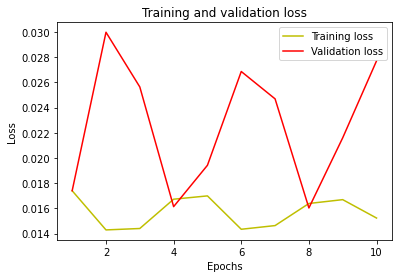

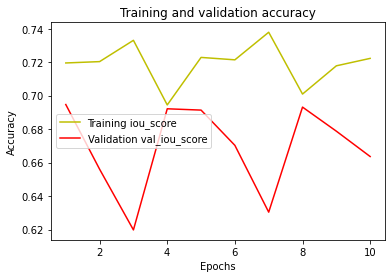

In [47]:
loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

iou_score = history2.history['iou_score']
val_iou_score = history2.history['val_iou_score']

plt.plot(epochs, iou_score, 'y', label='Training iou_score')
plt.plot(epochs, val_iou_score, 'r', label='Validation val_iou_score')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [48]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())



Mean IoU = 0.67924595


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


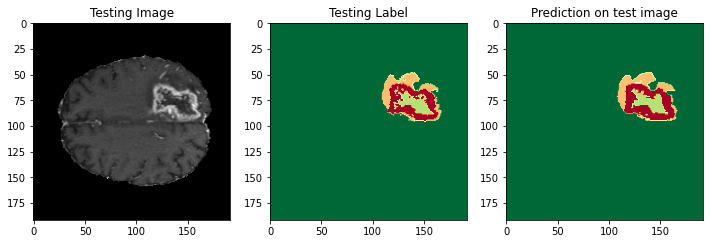

In [112]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 44

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 85
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice], cmap='RdYlGn_r')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice], cmap='RdYlGn_r')
plt.show()
fig.savefig('result9june.png')

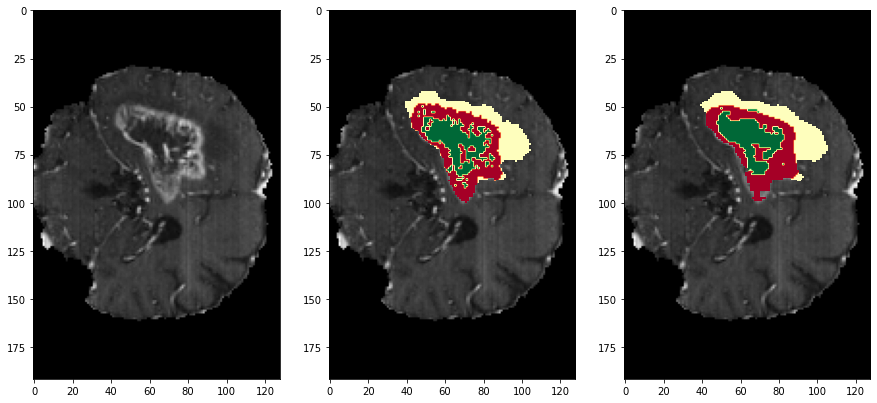

In [127]:
# Skip 50:-50 slices since there is not much to see
n_slice = 120
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,15))
ax1.imshow(test_img[:,n_slice,:,1], cmap = 'gray')
ax2.imshow(test_img[:,n_slice,:,1], cmap = 'gray')

mask = test_mask_argmax[:,n_slice,:]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,n_slice,:,1], cmap = 'gray')

mask = test_prediction_argmax[:,n_slice,:]
ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
fig.savefig('result9juneoverlap.png')

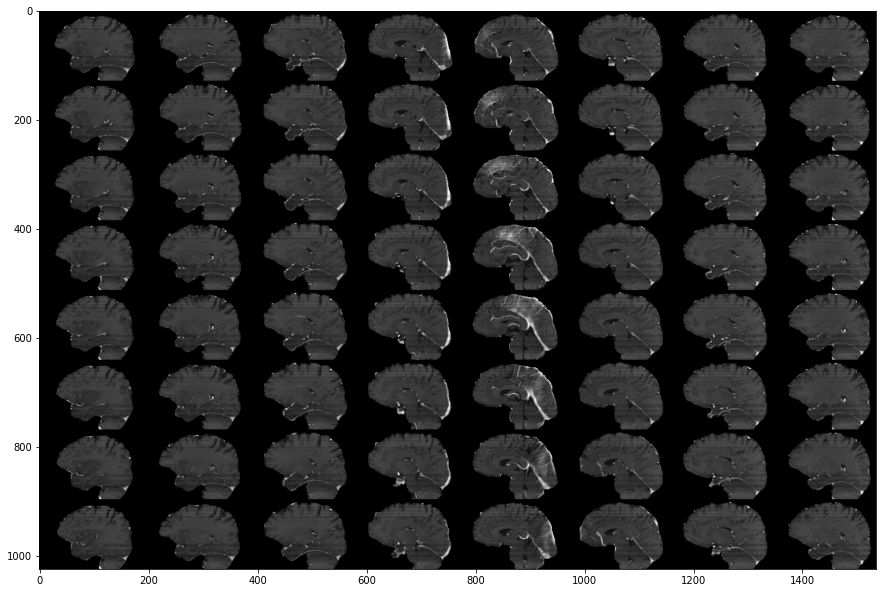

In [339]:
# Skip 50:-50 slices since there is not much to see
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(test_img[60:124,:,:,1]), 90, resize=True), cmap ='gray')

mask = np.rot90(montage(test_prediction_argmax[60:124,:,:]))

ax1.imshow(np.ma.masked_where(mask == False, mask), cmap='RdYlGn_r',
            alpha=1)

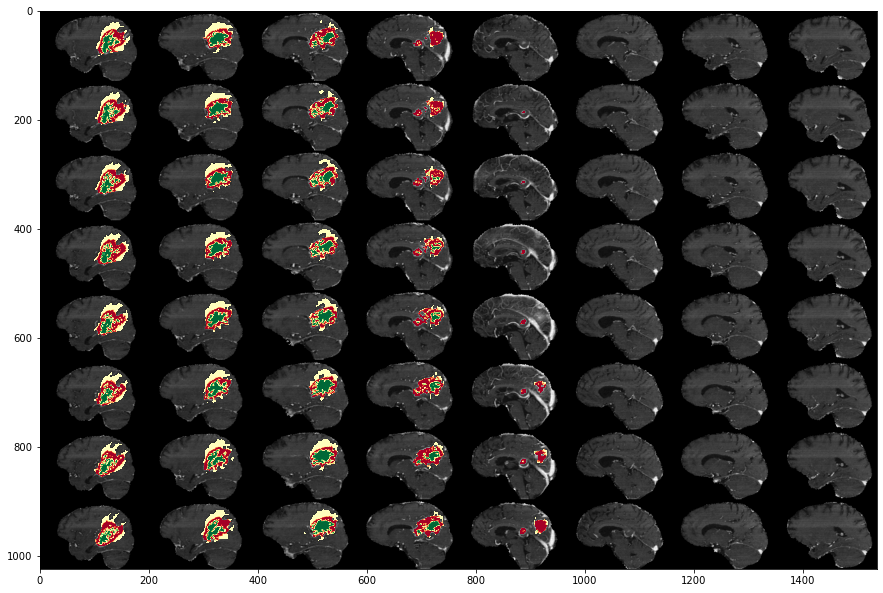

In [121]:
# Skip 50:-50 slices since there is not much to see
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(test_img[60:124,:,:,1]), 90, resize=True), cmap ='gray')

mask = np.rot90(montage(test_mask_argmax[60:124,:,:]))

ax1.imshow(np.ma.masked_where(mask == False, mask), cmap='RdYlGn_r',
            alpha=1)

TypeError: Data given cannot be loaded because it is not compatible with nibabel format:
0.0

In [31]:
from keras.models import load_model

#Load model for prediction or continue training

#For continuing training....
#The following gives an error: Unknown loss function: dice_loss_plus_1focal_loss
#This is because the model does not save loss function and metrics. So to compile and 
#continue training we need to provide these as custom_objects.
#my_model = load_model('Seg_BraTS_3d.hdf5')

#So let us add the loss as custom object... but the following throws another error...
#Unknown metric function: iou_score
#my_model = load_model('saved_models/brats_3d_100epochs_simple_unet_weighted_dice.hdf5', 
                     # custom_objects={'dice_loss_plus_1focal_loss': total_loss})

#Now, let us add the iou_score function we used during our initial training
model = load_model('diceall_6june.h5',custom_objects={'dice_loss_plus_1focal_loss': total_loss,
                                                      'iou_score':sm.metrics.IOUScore(threshold=0.5),
                                                      'dice_coef': dice_coef,
                                                      'dice_coef_TC': dice_coef_TC,
                                                      'dice_coef_WT': dice_coef_WT ,
                                                      'dice_coef_ET':dice_coef_ET,
                                                      'precision': precision,
                                                      'precision_TC': precision_TC,
                                                      'precision_WT': precision_WT,
                                                      'precision_ET': precision_ET,
                                                      'sensitivity': sensitivity,
                                                      'sensitivity_TC': sensitivity_TC,
                                                      'sensitivity_WT': sensitivity_WT,
                                                      'sensitivity_ET': sensitivity_ET,
                                                      'specificity': specificity,
                                                      'specificity_TC': specificity_TC,
                                                      'specificity_WT': specificity_WT,
                                                      'specificity_ET': specificity_ET,
                                                      'f1-score':sm.metrics.FScore(threshold=0.5)
                                                     })


steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size
#Now all set to continue the training process. 
history2=model.fit(train_img_datagen,steps_per_epoch=steps_per_epoch,epochs=10,  verbose=1, validation_data=val_img_datagen,validation_steps=val_steps_per_epoch, callbacks=[tensorboard,checkpoint,reduce_lr])

Epoch 1/10


2022-06-08 16:55:29.546781: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.
2022-06-08 16:55:29.546811: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.


  1/138 [..............................] - ETA: 1:20:55 - loss: 0.0166 - accuracy: 0.9943 - iou_score: 0.6152 - f1-score: 0.7410 - dice_coef: 0.6773 - dice_coef_TC: 0.6993 - dice_coef_WT: 0.6864 - dice_coef_ET: 0.7499 - precision: 0.9951 - precision_TC: 0.5478 - precision_WT: 0.6985 - precision_ET: 0.9704 - sensitivity: 0.9936 - sensitivity_TC: 0.7668 - sensitivity_WT: 0.5717 - sensitivity_ET: 0.5440 - specificity: 0.9984 - specificity_TC: 0.9975 - specificity_WT: 0.9989 - specificity_ET: 0.9999

2022-06-08 16:56:00.846908: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.
2022-06-08 16:56:00.846947: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.


  2/138 [..............................] - ETA: 1:10:00 - loss: 0.0191 - accuracy: 0.9934 - iou_score: 0.6813 - f1-score: 0.7932 - dice_coef: 0.7199 - dice_coef_TC: 0.7973 - dice_coef_WT: 0.7271 - dice_coef_ET: 0.7831 - precision: 0.9945 - precision_TC: 0.7468 - precision_WT: 0.7344 - precision_ET: 0.8814 - sensitivity: 0.9926 - sensitivity_TC: 0.7972 - sensitivity_WT: 0.6196 - sensitivity_ET: 0.6618 - specificity: 0.9982 - specificity_TC: 0.9984 - specificity_WT: 0.9983 - specificity_ET: 0.9996

2022-06-08 16:56:32.085832: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.


138/138 [==============================] - ETA: 0s - loss: 0.0170 - accuracy: 0.9940 - iou_score: 0.7046 - f1-score: 0.8055 - dice_coef: 0.7226 - dice_coef_TC: 0.7436 - dice_coef_WT: 0.8202 - dice_coef_ET: 0.7790 - precision: 0.9950 - precision_TC: 0.7876 - precision_WT: 0.8191 - precision_ET: 0.7747 - sensitivity: 0.9931 - sensitivity_TC: 0.6629 - sensitivity_WT: 0.7599 - sensitivity_ET: 0.7432 - specificity: 0.9983 - specificity_TC: 0.9994 - specificity_WT: 0.9983 - specificity_ET: 0.9993 
Epoch 1: val_accuracy improved from -inf to 0.99259, saving model to diceall_6june.h5
138/138 [==============================] - 4544s 33s/step - loss: 0.0170 - accuracy: 0.9940 - iou_score: 0.7046 - f1-score: 0.8055 - dice_coef: 0.7226 - dice_coef_TC: 0.7436 - dice_coef_WT: 0.8202 - dice_coef_ET: 0.7790 - precision: 0.9950 - precision_TC: 0.7876 - precision_WT: 0.8191 - precision_ET: 0.7747 - sensitivity: 0.9931 - sensitivity_TC: 0.6629 - sensitivity_WT: 0.7599 - sensitivity_ET: 0.7432 - specifici

Epoch 6/10
138/138 [==============================] - ETA: 0s - loss: 0.0158 - accuracy: 0.9944 - iou_score: 0.7178 - f1-score: 0.8162 - dice_coef: 0.7367 - dice_coef_TC: 0.7619 - dice_coef_WT: 0.8336 - dice_coef_ET: 0.7871 - precision: 0.9953 - precision_TC: 0.8015 - precision_WT: 0.8302 - precision_ET: 0.7815 - sensitivity: 0.9936 - sensitivity_TC: 0.6792 - sensitivity_WT: 0.7759 - sensitivity_ET: 0.7511 - specificity: 0.9984 - specificity_TC: 0.9994 - specificity_WT: 0.9984 - specificity_ET: 0.9994 
Epoch 6: val_accuracy improved from 0.99260 to 0.99261, saving model to diceall_6june.h5

Epoch 6: ReduceLROnPlateau reducing learning rate to 3.906250185536919e-06.
138/138 [==============================] - 4614s 33s/step - loss: 0.0158 - accuracy: 0.9944 - iou_score: 0.7178 - f1-score: 0.8162 - dice_coef: 0.7367 - dice_coef_TC: 0.7619 - dice_coef_WT: 0.8336 - dice_coef_ET: 0.7871 - precision: 0.9953 - precision_TC: 0.8015 - precision_WT: 0.8302 - precision_ET: 0.7815 - sensitivity: 0.

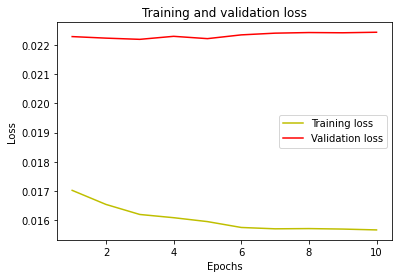

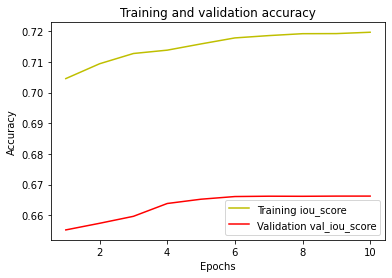

In [32]:
loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

iou_score = history2.history['iou_score']
val_iou_score = history2.history['val_iou_score']

plt.plot(epochs, iou_score, 'y', label='Training iou_score')
plt.plot(epochs, val_iou_score, 'r', label='Validation val_iou_score')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [35]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())



Mean IoU = 0.67983013


In [1]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 173

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 85
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice], cmap='gnuplot')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice], cmap='gnuplot')
plt.show()
fig.savefig('result21.png')

NameError: name 'np' is not defined

In [ ]:
steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size

history2=model1.fit(train_img_datagen,
          steps_per_epoch=steps_per_epoch,
          epochs=10,
          verbose=1,
          validation_data=val_img_datagen,
          validation_steps=val_steps_per_epoch,
          callbacks=[tensorboard,checkpoint,reduce_lr])

model1.save('786.hdf5')

Epoch 1/10


2022-11-17 10:18:42.107925: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 5435817984 exceeds 10% of free system memory.
2022-11-17 10:18:42.107976: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 5435817984 exceeds 10% of free system memory.
2022-11-17 10:18:46.570663: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.
2022-11-17 10:18:46.570733: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.


  1/138 [..............................] - ETA: 1:31:29 - loss: 1.1819 - accuracy: 0.2919 - iou_score: 0.0400 - f1-score: 0.0724 - dice_coef: 0.1324 - dice_coef_TC: 0.0167 - dice_coef_WT: 0.0193 - dice_coef_ET: 0.0513 - precision: 0.5696 - precision_TC: 0.0058 - precision_WT: 0.0095 - precision_ET: 0.0334 - sensitivity: 0.1295 - sensitivity_TC: 0.0165 - sensitivity_WT: 0.1670 - sensitivity_ET: 0.0339 - specificity: 0.9674 - specificity_TC: 0.9887 - specificity_WT: 0.9235 - specificity_ET: 0.9949

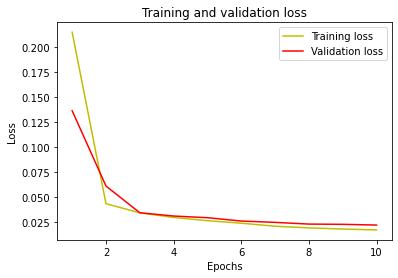

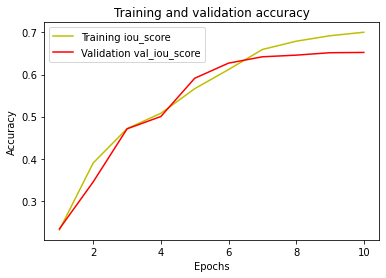

In [13]:
loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

iou_score = history2.history['iou_score']
val_iou_score = history2.history['val_iou_score']

plt.plot(epochs, iou_score, 'y', label='Training iou_score')
plt.plot(epochs, val_iou_score, 'r', label='Validation val_iou_score')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [14]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model1.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())



Mean IoU = 0.68430877


In [112]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 38

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model1.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))



(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


NameError: name 'medpy' is not defined

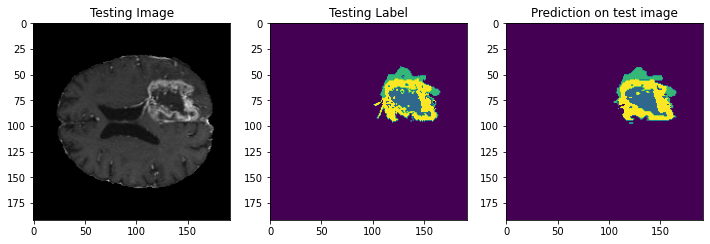

In [22]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 80
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()
fig.savefig('result1.png')

In [114]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 130

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model1.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


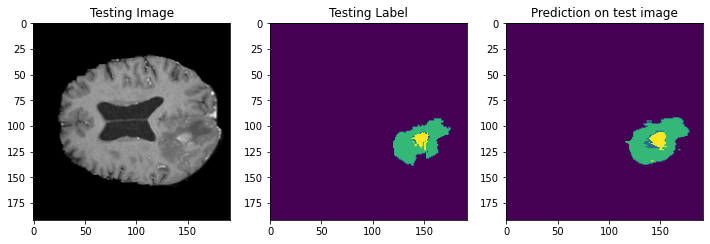

In [115]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 80
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()
fig.savefig('result2.png')

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


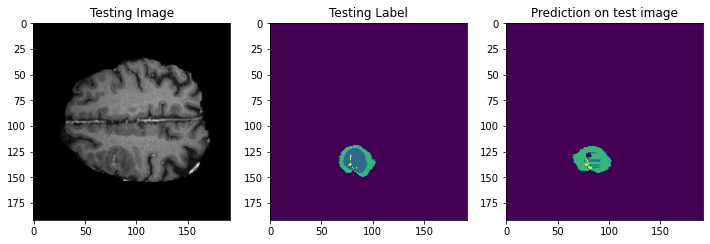

In [25]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 140

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 95
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


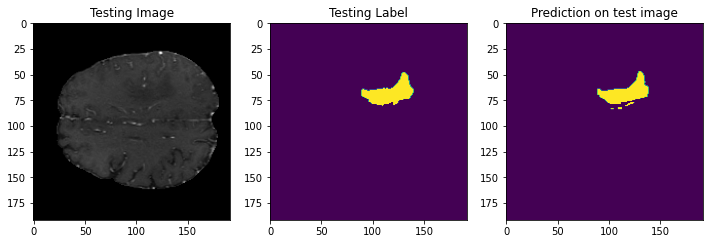

In [36]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 111

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 85
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()
fig.savefig('result4.png')

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


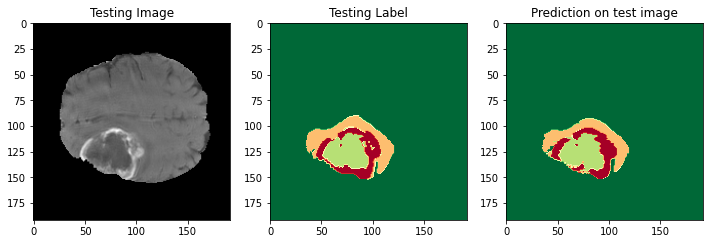

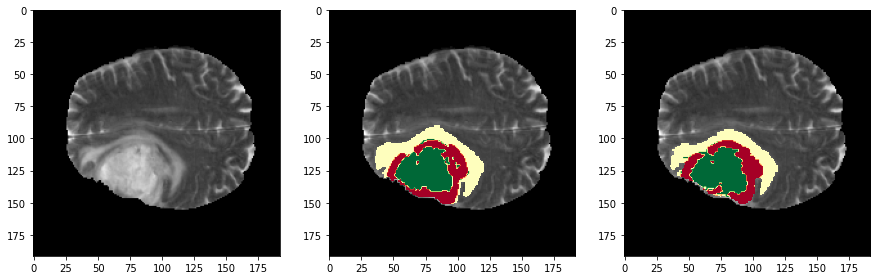

In [70]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 162

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))
n_slice = 82

#n_slice=random.randint(0, test_prediction_argmax.shape[2])

fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice], cmap='RdYlGn_r')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice], cmap='RdYlGn_r')
plt.show()


# Skip 50:-50 slices since there is not much to see
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,2], cmap = 'gray')
ax2.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)

fig.savefig("second.png")





#82

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


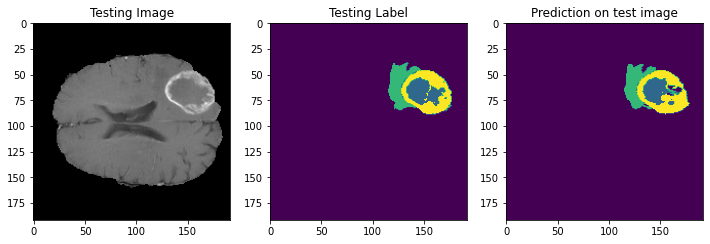

In [50]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 177

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 70
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


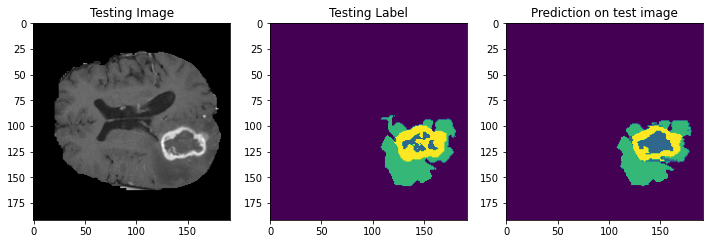

In [55]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 200

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 65
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


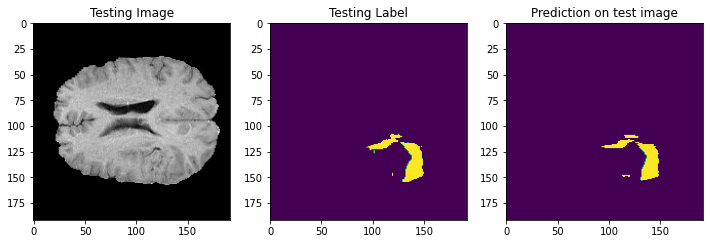

In [121]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 202

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model1.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 75
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()
fig.savefig('result8.png')

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


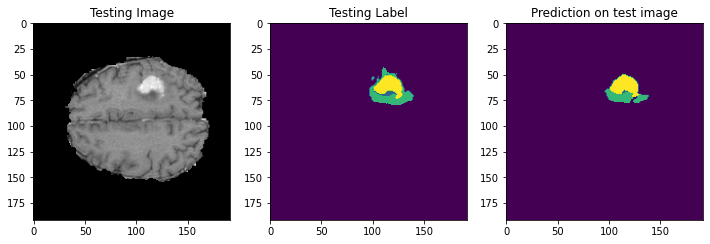

In [122]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 221

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model1.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 90
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()
fig.savefig('result9.png')

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


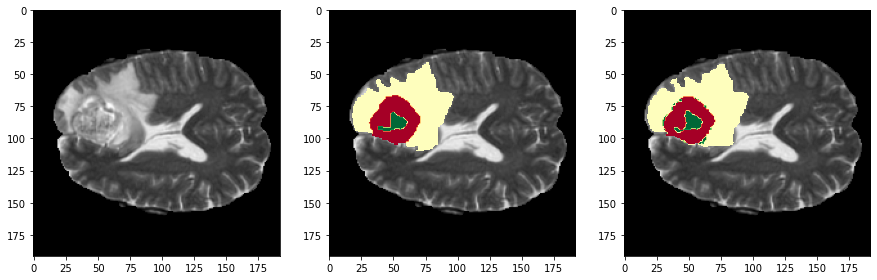

In [71]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 222

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))
n_slice = 71
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random
# Skip 50:-50 slices since there is not much to see
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,2], cmap = 'gray')
ax2.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)

fig.savefig("third.png")

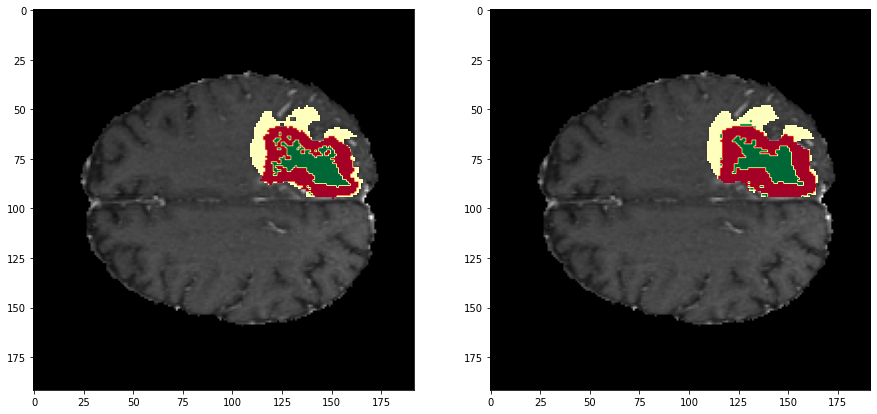

In [118]:
# Skip 50:-50 slices since there is not much to see
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax1.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax2.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
fig.savefig('result9juneoverlap.png')

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


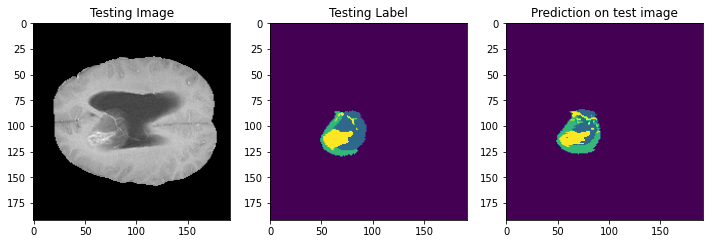

In [74]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 233

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 80
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


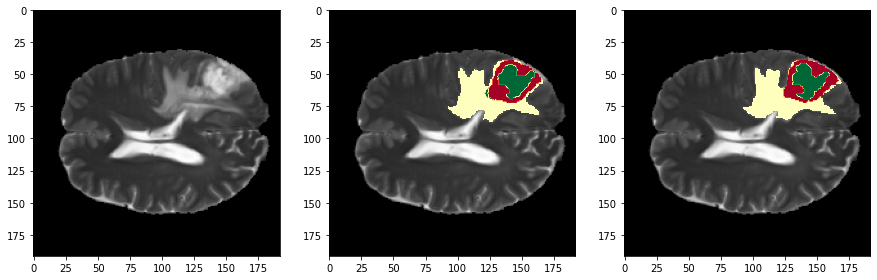

In [72]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 243

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))
n_slice = 77
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random
# Skip 50:-50 slices since there is not much to see
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,2], cmap = 'gray')
ax2.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)

fig.savefig("fourth.png")

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


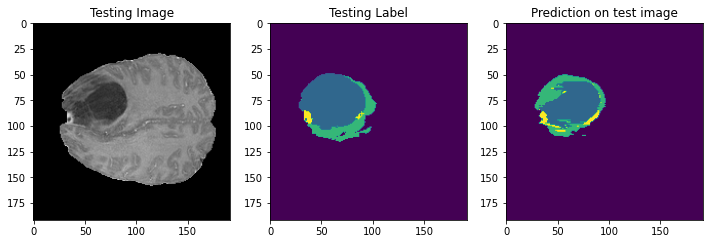

In [86]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 283

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 90
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


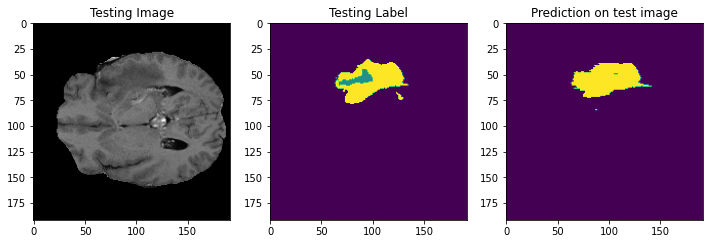

In [90]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 293

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 50
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


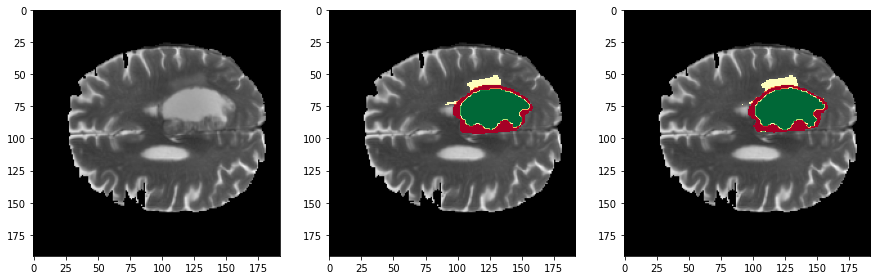

In [73]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 345

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))
n_slice = 87
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random
# Skip 50:-50 slices since there is not much to see
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,2], cmap = 'gray')
ax2.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)

fig.savefig("fifth.png")

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


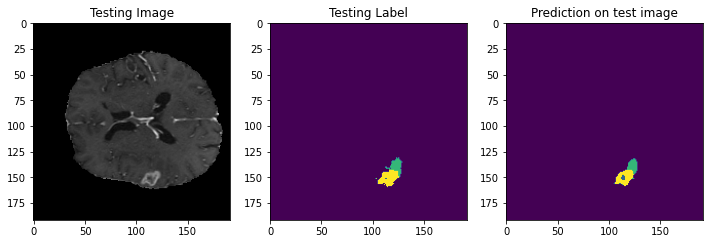

In [129]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 35

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model1.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 65
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()
fig.savefig('result16.png')

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


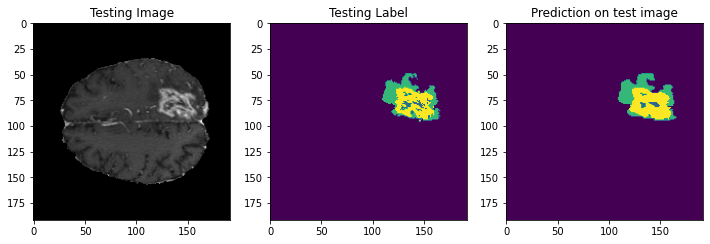

In [112]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 44

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice =90
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


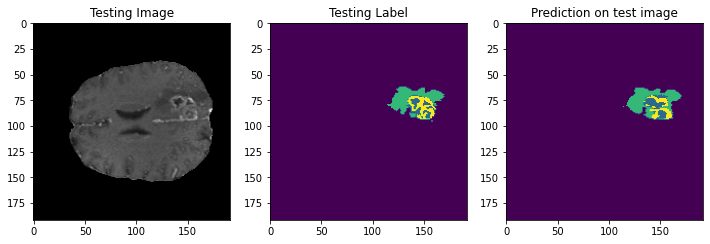

In [114]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 75

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 80
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


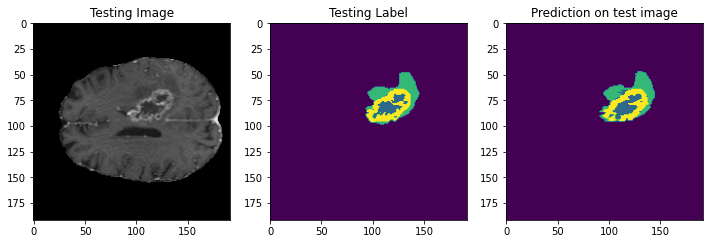

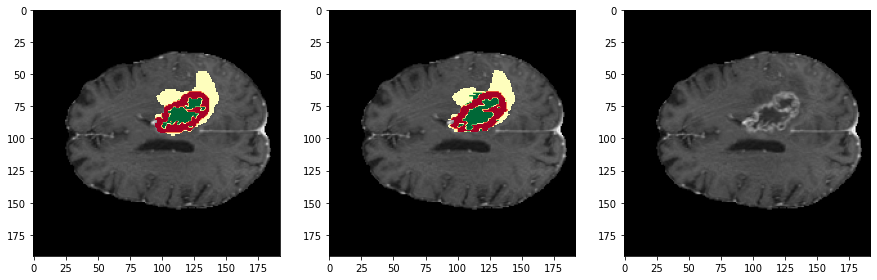

In [28]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 95

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)


test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 78
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax1.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax2.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,:,n_slice,1], cmap = 'gray')
fig.savefig("sixth.png")

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)
1/1 [==============================] - 2s 2s/step


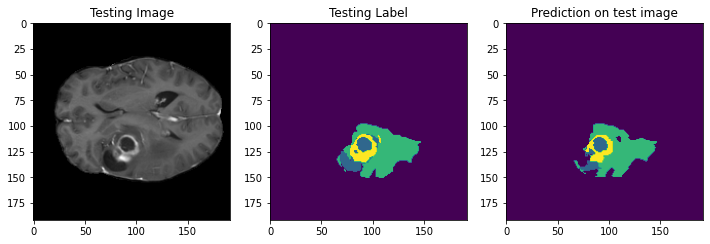

In [49]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 155

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)
a = test_prediction.reshape(192,192,128,4)
test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 60
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()
fig.savefig('result20.png')

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)
1/1 [==============================] - 2s 2s/step


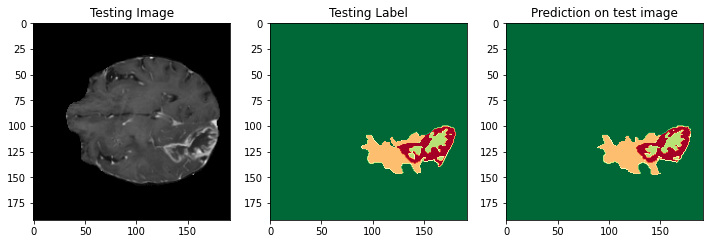

In [50]:
img_num = 154


test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/train/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/train/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)


test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 54
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice], cmap='RdYlGn_r')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice], cmap='RdYlGn_r')
plt.show()

In [ ]:
121, axial-78, coronal-109, saggital-130
154

In [10]:
from keras.models import load_model
model = load_model('diceall_6june.h5', 
                      compile=False)

In [103]:
temp_mask=nib.load("brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_166/brainTumorMask_SRI.nii.gz").get_fdata()
temp_mask=temp_mask.astype(np.uint8)
temp_mask[temp_mask==4] = 3 
temp_mask = temp_mask[24:216, 24:216, 13:141]

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)
1/1 [==============================] - 2s 2s/step


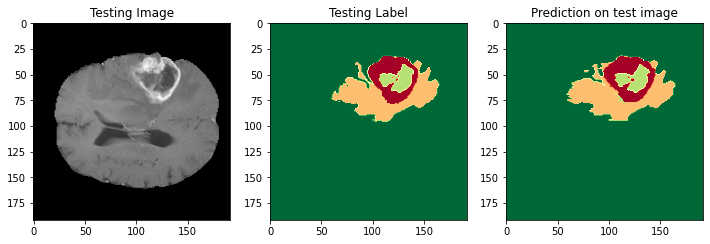

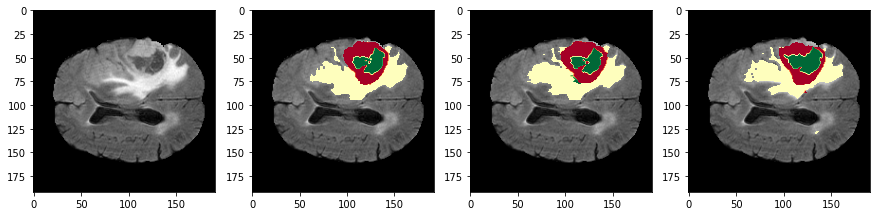

In [113]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 165

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/train/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/train/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random
#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 71
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice], cmap='RdYlGn_r')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice], cmap='RdYlGn_r')
plt.show()
fig.savefig('result23.png')
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,0], cmap = 'gray')
ax2.imshow(test_img[:,:,n_slice,0], cmap = 'gray')
mask = test_mask_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,:,n_slice,0], cmap = 'gray')
mask = test_prediction_argmax[:,:,n_slice]
ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax4.imshow(test_img[:,:,n_slice,0], cmap = 'gray')
mask = temp_mask[:,:,n_slice]
ax4.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
fig.savefig('aug5_axial.png')

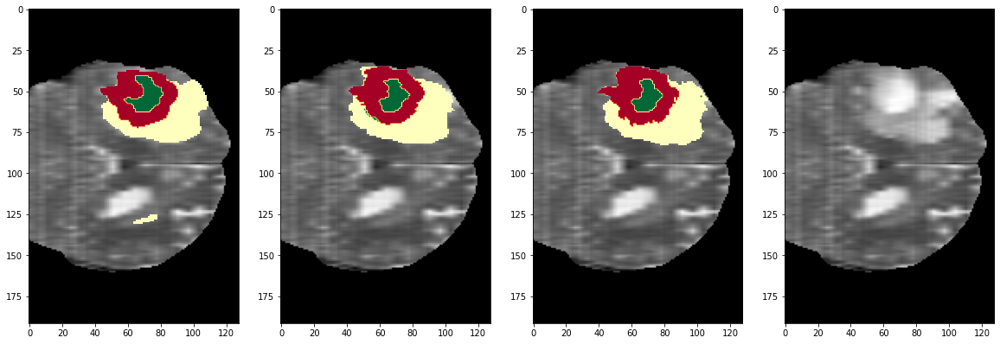

In [151]:

n_slice = 135

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (20,15))
ax4.imshow(test_img[:,n_slice,:,2], cmap = 'gray')


ax3.imshow(test_img[:,n_slice,:,2], cmap = 'gray')

mask = test_mask_argmax[:,n_slice,:]

ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)


ax2.imshow(test_img[:,n_slice,:,2], cmap = 'gray')

mask = test_prediction_argmax[:,n_slice,:]

ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)


ax1.imshow(test_img[:,n_slice,:,2], cmap = 'gray')

mask = temp_mask[:,n_slice,:]

ax1.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)

fig.savefig('coronal.png')

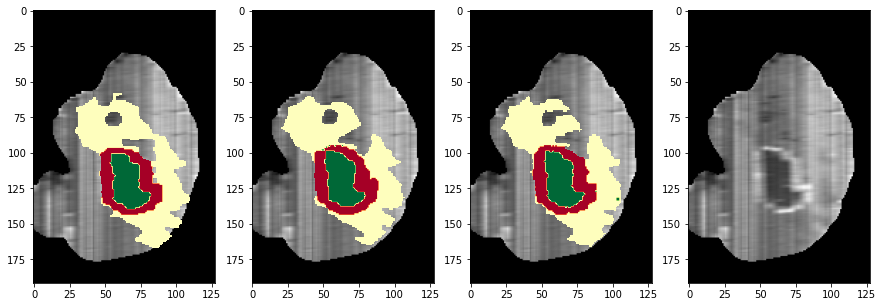

In [165]:

n_slice =56
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (15,15))
ax4.imshow(test_img[n_slice,:,:,1], cmap = 'gray')


ax3.imshow(test_img[n_slice,:,:,1], cmap = 'gray')

mask = test_mask_argmax[n_slice,:,:]

ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)


ax2.imshow(test_img[n_slice,:,:,1], cmap = 'gray')

mask = test_prediction_argmax[n_slice,:,:]

ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)


ax1.imshow(test_img[n_slice,:,:,1], cmap = 'gray')

mask = temp_mask[n_slice,:,:]

ax1.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)

fig.savefig('aug5_sagittal.png')

In [31]:
temp_mask=nib.load("brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_174/brainTumorMask_SRI.nii.gz").get_fdata()
temp_mask=temp_mask.astype(np.uint8)
temp_mask[temp_mask==4] = 3 
temp_mask = temp_mask[24:216, 24:216, 13:141]

(1, 192, 192, 128, 3)
(1, 36864, 128, 3)
1/1 [==============================] - 2s 2s/step


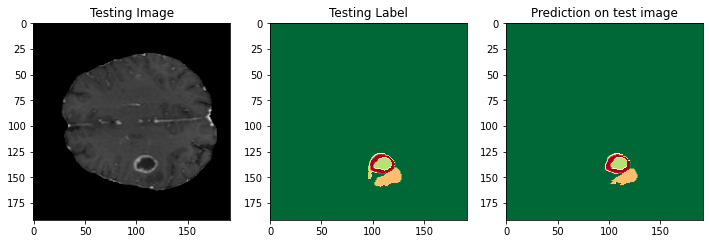

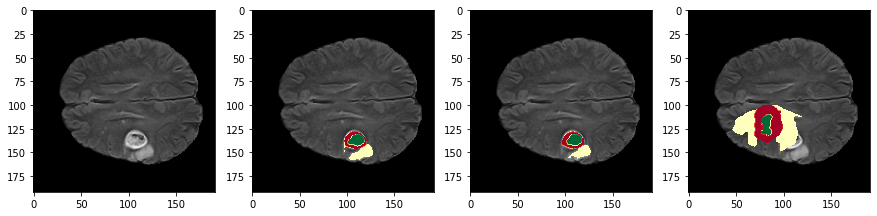

In [32]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 121

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/train/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/train/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))

#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 78
fig = plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice], cmap='RdYlGn_r')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice], cmap='RdYlGn_r')
plt.show()
fig.savefig('result23.png')

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,0], cmap = 'gray')


ax2.imshow(test_img[:,:,n_slice,0], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]

ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)


ax3.imshow(test_img[:,:,n_slice,0], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]

ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)


ax4.imshow(test_img[:,:,n_slice,0], cmap = 'gray')

mask = temp_mask[:,:,n_slice]

ax4.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)



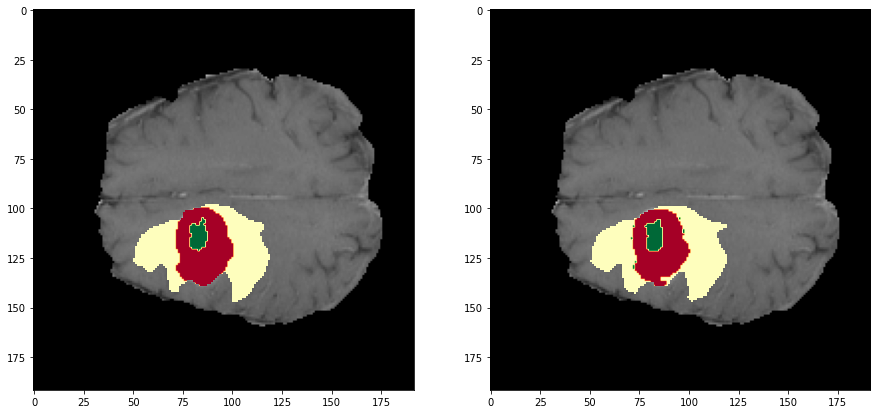

In [42]:
# Skip 50:-50 slices since there is not much to see
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax1.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax2.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
fig.savefig('resultll.png')

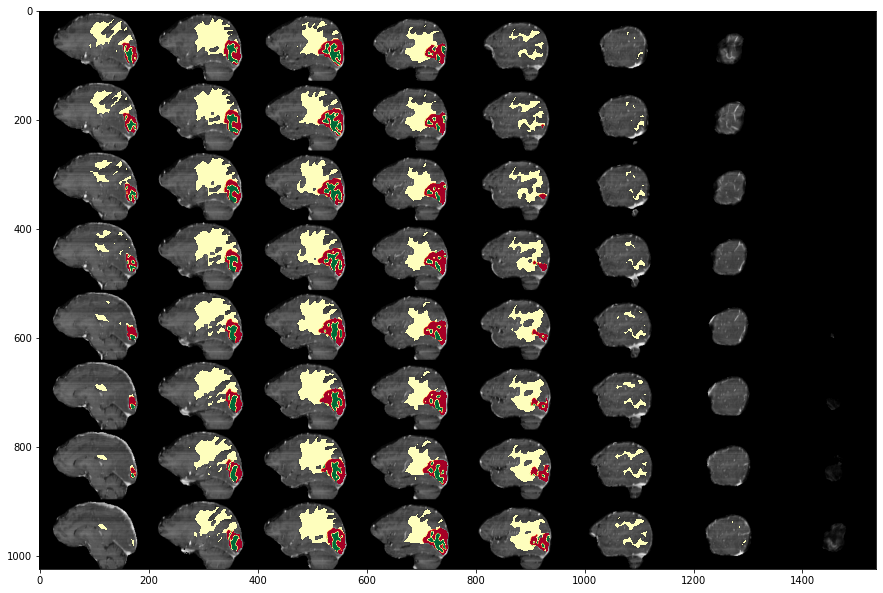

In [279]:
# Skip 50:-50 slices since there is not much to see
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(test_img[100:164,:,:,1]), 90, resize=True), cmap ='gray')

mask = np.rot90(montage(test_prediction_argmax[100:164,:,:]))

ax1.imshow(np.ma.masked_where(mask == False, mask), cmap='RdYlGn_r',
            alpha=1)

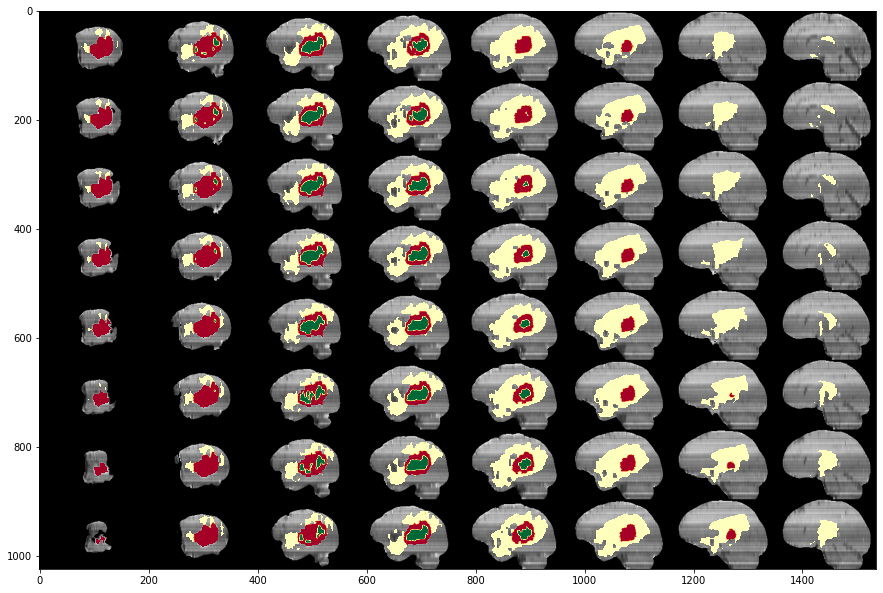

In [217]:
# Skip 50:-50 slices since there is not much to see
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(test_img[30:94,:,:,1]), 90, resize=True), cmap ='gray')

mask = np.rot90(montage(test_mask_argmax[30:94,:,:]))

ax1.imshow(np.ma.masked_where(mask == False, mask), cmap='RdYlGn_r',
            alpha=1)

In [15]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())



2022-06-09 17:49:57.605204: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6039797760 exceeds 10% of free system memory.
2022-06-09 17:49:59.928239: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 4831838208 exceeds 10% of free system memory.


Mean IoU = 0.67988455


In [95]:
import medpy
from medpy import metric
medpy.metric.binary.hd(test_prediction_argmax, test_mask_argmax, voxelspacing=None, connectivity=1)

25.865034312755125

In [118]:
import nilearn as nl

import nilearn.plotting as nlplt
nlplt.plot_roi(test_prediction_argmax, 
               title='mask plot_roi',
               bg_img=test_img, 
              cmap='Paired')

plt.show()

TypeError: Data given cannot be loaded because it is not compatible with nibabel format:
0.0

ValueError: Input array has to be 3-dimensional for grayscale images, or 4-dimensional with `multichannel=True` for color images.

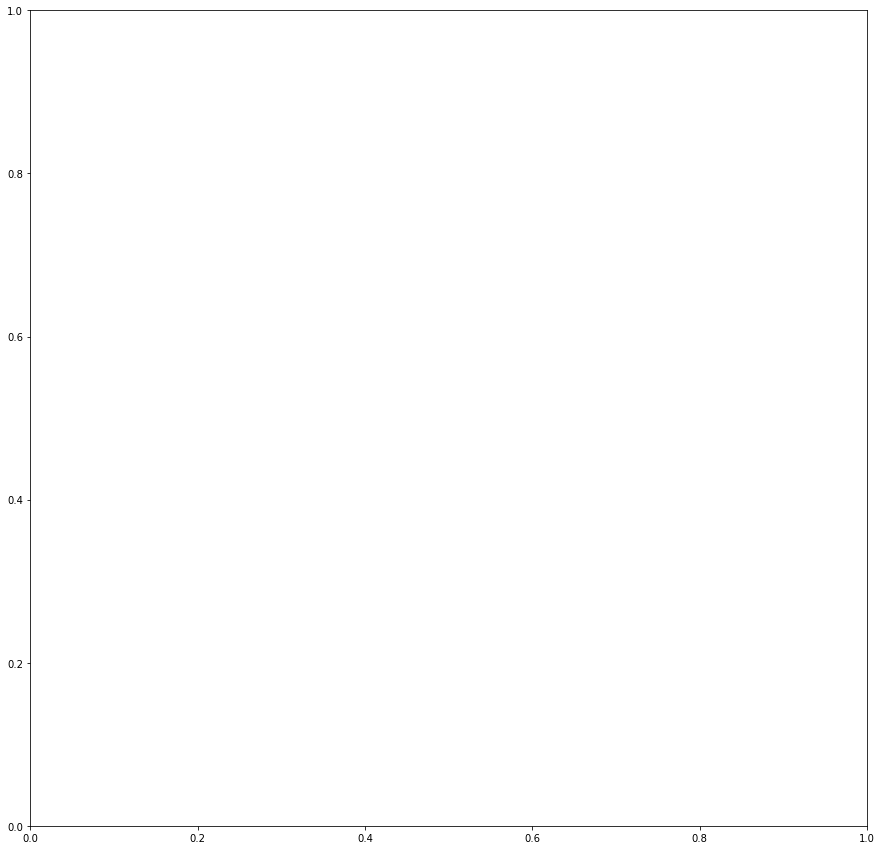

In [112]:
from skimage.transform import rotate
from skimage.transform import resize
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(a[50:-50,:,:]), 90, resize=True), cmap ='gray')

In [ ]:
steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size

history2=model1.fit(train_img_datagen,
          steps_per_epoch=steps_per_epoch,
          epochs=25,
          verbose=1,
          validation_data=val_img_datagen,
          validation_steps=val_steps_per_epoch,
          callbacks=[tensorboard,checkpoint,reduce_lr])


Epoch 1/25


2022-05-14 15:05:15.280616: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.
2022-05-14 15:05:15.280646: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.


  1/138 [..............................] - ETA: 1:27:54 - loss: 1.4713 - accuracy: 0.6053 - iou_score: 0.0174 - f1-score: 0.0340 - dice_coef: 0.1176 - dice_coef_TC: 0.0203 - dice_coef_WT: 0.0498 - dice_coef_ET: 0.0298 - precision: 0.1689 - precision_TC: 0.0089 - precision_WT: 0.0252 - precision_ET: 0.0140 - sensitivity: 0.0271 - sensitivity_TC: 0.1186 - sensitivity_WT: 0.2901 - sensitivity_ET: 0.0838 - specificity: 0.9556 - specificity_TC: 0.9472 - specificity_WT: 0.9508 - specificity_ET: 0.9693

2022-05-14 15:05:47.175707: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.
2022-05-14 15:05:47.175751: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.


  2/138 [..............................] - ETA: 1:12:09 - loss: 1.3987 - accuracy: 0.6372 - iou_score: 0.0220 - f1-score: 0.0428 - dice_coef: 0.1267 - dice_coef_TC: 0.0377 - dice_coef_WT: 0.0828 - dice_coef_ET: 0.0273 - precision: 0.1825 - precision_TC: 0.0162 - precision_WT: 0.0410 - precision_ET: 0.0158 - sensitivity: 0.0273 - sensitivity_TC: 0.0981 - sensitivity_WT: 0.2686 - sensitivity_ET: 0.1019 - specificity: 0.9590 - specificity_TC: 0.9527 - specificity_WT: 0.9519 - specificity_ET: 0.9735

2022-05-14 15:06:19.232275: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.


138/138 [==============================] - ETA: 0s - loss: 0.1690 - accuracy: 0.9677 - iou_score: 0.3390 - f1-score: 0.3944 - dice_coef: 0.3484 - dice_coef_TC: 0.2281 - dice_coef_WT: 0.4869 - dice_coef_ET: 0.3758 - precision: 0.9633 - precision_TC: 0.0074 - precision_WT: 0.6082 - precision_ET: 0.6174 - sensitivity: 0.9229 - sensitivity_TC: 0.0081 - sensitivity_WT: 0.3546 - sensitivity_ET: 0.1764 - specificity: 0.9957 - specificity_TC: 0.9981 - specificity_WT: 0.9955 - specificity_ET: 0.9986 
Epoch 1: val_accuracy improved from -inf to 0.90071, saving model to diceall_14may.h5
138/138 [==============================] - 4780s 35s/step - loss: 0.1690 - accuracy: 0.9677 - iou_score: 0.3390 - f1-score: 0.3944 - dice_coef: 0.3484 - dice_coef_TC: 0.2281 - dice_coef_WT: 0.4869 - dice_coef_ET: 0.3758 - precision: 0.9633 - precision_TC: 0.0074 - precision_WT: 0.6082 - precision_ET: 0.6174 - sensitivity: 0.9229 - sensitivity_TC: 0.0081 - sensitivity_WT: 0.3546 - sensitivity_ET: 0.1764 - specifici

 25/138 [====>.........................] - ETA: 1:01:56 - loss: 0.0248 - accuracy: 0.9912 - iou_score: 0.6236 - f1-score: 0.7331 - dice_coef: 0.6375 - dice_coef_TC: 0.5739 - dice_coef_WT: 0.7216 - dice_coef_ET: 0.7698 - precision: 0.9928 - precision_TC: 0.6212 - precision_WT: 0.7254 - precision_ET: 0.8251 - sensitivity: 0.9900 - sensitivity_TC: 0.5596 - sensitivity_WT: 0.6614 - sensitivity_ET: 0.6942 - specificity: 0.9976 - specificity_TC: 0.9988 - specificity_WT: 0.9972 - specificity_ET: 0.9995

In [ ]:
loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

iou_score = history2.history['iou_score']
val_iou_score = history2.history['val_iou_score']

plt.plot(epochs, iou_score, 'y', label='Training iou_score')
plt.plot(epochs, val_iou_score, 'r', label='Validation val_iou_score')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model1.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())



In [ ]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 38

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model1.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))



In [ ]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 80
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()

In [ ]:
#dice loss as defined above for 4 classes
def dice_coef(y_true, y_pred, smooth=1.0):
    class_num = 4
    for i in range(class_num):
        y_true_f = K.flatten(y_true[:,:,:,i])
        y_pred_f = K.flatten(y_pred[:,:,:,i])
        intersection = K.sum(y_true_f * y_pred_f)
        loss = ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))
   #     K.print_tensor(loss, message='loss value for class {} : '.format(SEGMENT_CLASSES[i]))
        if i == 0:
            total_loss = loss
        else:
            total_loss = total_loss + loss
    total_loss = total_loss / class_num
#    K.print_tensor(total_loss, message=' total dice coef: ')
    return total_loss


 
# define per class evaluation of dice coef
# inspired by https://github.com/keras-team/keras/issues/9395
def dice_coef_necrotic(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,1] * y_pred[:,:,:,1]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,1])) + K.sum(K.square(y_pred[:,:,:,1])) + epsilon)

def dice_coef_edema(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,2] * y_pred[:,:,:,2]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,2])) + K.sum(K.square(y_pred[:,:,:,2])) + epsilon)

def dice_coef_enhancing(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,3] * y_pred[:,:,:,3]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,3])) + K.sum(K.square(y_pred[:,:,:,3])) + epsilon)



# Computing Precision 
def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

    
# Computing Sensitivity      
def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())


# Computing Specificity
def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

In [15]:
steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size

In [16]:
from keras.models import load_model

#Load model for prediction or continue training

#For continuing training....
#The following gives an error: Unknown loss function: dice_loss_plus_1focal_loss
#This is because the model does not save loss function and metrics. So to compile and 
#continue training we need to provide these as custom_objects.
#my_model = load_model('Seg_BraTS_3d.hdf5')

#So let us add the loss as custom object... but the following throws another error...
#Unknown metric function: iou_score
#my_model = load_model('saved_models/brats_3d_100epochs_simple_unet_weighted_dice.hdf5', 
                     # custom_objects={'dice_loss_plus_1focal_loss': total_loss})

#Now, let us add the iou_score function we used during our initial training
model = load_model('diceall_6june.h5', 
                      custom_objects={'dice_loss_plus_1focal_loss': total_loss,
                                      'iou_score':sm.metrics.IOUScore(threshold=0.5),
                                      'f1-score':sm.metrics.FScore(threshold=0.5)})

#Now all set to continue the training process. 
history3=model.fit(train_img_datagen,
          steps_per_epoch=steps_per_epoch,
          epochs=10,
          verbose=1,
          validation_data=val_img_datagen,
          validation_steps=val_steps_per_epoch,
          callbacks=[tensorboard,checkpoint,reduce_lr])

Epoch 1/3
34/34 [==============================] - 1181s 35s/step - loss: 0.7559 - iou_score: 0.5910 - f1-score: 0.7053 - val_loss: 0.7567 - val_iou_score: 0.5778 - val_f1-score: 0.6924
Epoch 2/3
34/34 [==============================] - 1174s 35s/step - loss: 0.7547 - iou_score: 0.6067 - f1-score: 0.7176 - val_loss: 0.7582 - val_iou_score: 0.5619 - val_f1-score: 0.6772
Epoch 3/3
34/34 [==============================] - 1176s 35s/step - loss: 0.7550 - iou_score: 0.5934 - f1-score: 0.7069 - val_loss: 0.7567 - val_iou_score: 0.4846 - val_f1-score: 0.5913


In [17]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model1.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())



Mean IoU = 0.6264034


(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


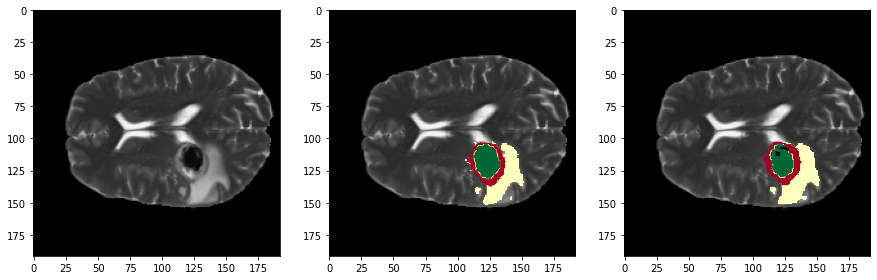

In [74]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 38

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))
n_slice = 72
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random
# Skip 50:-50 slices since there is not much to see
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,2], cmap = 'gray')
ax2.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,:,n_slice,2], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax3.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)

fig.savefig("sixth.png")


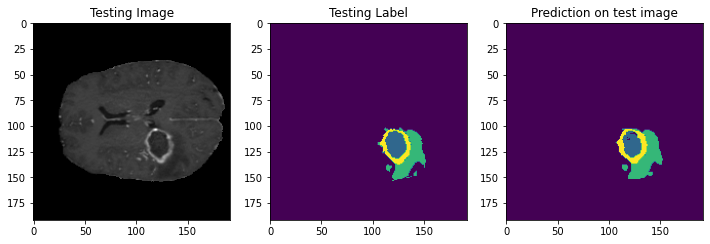

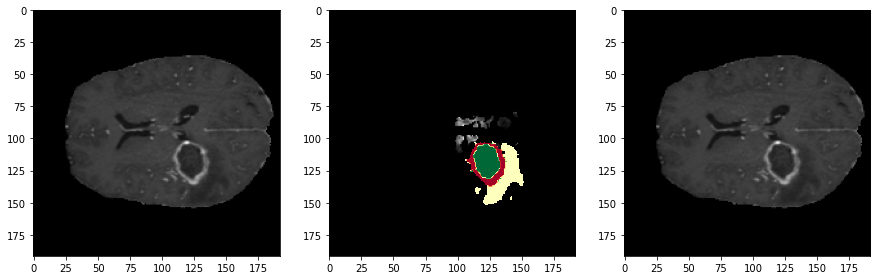

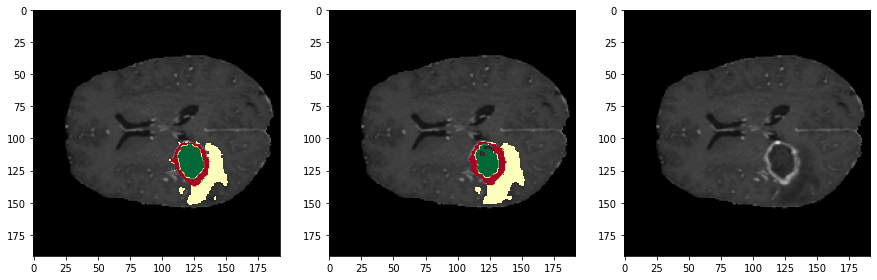

In [31]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 72
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()
#72
n_slice = 72
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,1], cmap = 'gray')
ax2.imshow(test_img[:,:,127,1], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]

ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15,15))
ax1.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

mask = test_mask_argmax[:,:,n_slice]
ax1.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax2.imshow(test_img[:,:,n_slice,1], cmap = 'gray')

mask = test_prediction_argmax[:,:,n_slice]
ax2.imshow(np.ma.masked_where(mask == False, mask),
           cmap='RdYlGn_r', alpha=1)
ax3.imshow(test_img[:,:,n_slice,1], cmap = 'gray')
fig.savefig("sixth.png")

In [72]:
from keras.models import load_model

#Load model for prediction or continue training

#For continuing training....
#The following gives an error: Unknown loss function: dice_loss_plus_1focal_loss
#This is because the model does not save loss function and metrics. So to compile and 
#continue training we need to provide these as custom_objects.
#my_model = load_model('Seg_BraTS_3d.hdf5')

#So let us add the loss as custom object... but the following throws another error...
#Unknown metric function: iou_score
#my_model = load_model('saved_models/brats_3d_100epochs_simple_unet_weighted_dice.hdf5', 
                     # custom_objects={'dice_loss_plus_1focal_loss': total_loss})

#Now, let us add the iou_score function we used during our initial training
from keras.models import load_model
model = load_model('6junetoday.hdf5', 
                      compile=False)

ValueError: Unknown layer: FixedDropout. Please ensure this object is passed to the `custom_objects` argument. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

In [12]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model1.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


2022-05-10 14:27:40.790210: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 3623878656 exceeds 10% of free system memory.
2022-05-10 14:27:40.967488: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 3623878656 exceeds 10% of free system memory.
2022-05-10 14:27:50.488642: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 2566914048 exceeds 10% of free system memory.
2022-05-10 14:27:52.123819: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 2415919104 exceeds 10% of free system memory.
2022-05-10 14:27:52.237586: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6039797760 exceeds 10% of free system memory.


Mean IoU = 0.008494309


In [13]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 38

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")



test_mask_argmax=np.argmax(test_mask, axis=3)





test_img_input = np.expand_dims(test_img, axis=0)
print(test_img_input.shape)
test_img_input = test_img_input.reshape(1,36864,128,3)
print(test_img_input.shape)
test_prediction = model1.predict(test_img_input)

test_prediction = test_prediction.reshape(1,192,192,128,4)

test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))



(1, 192, 192, 128, 3)
(1, 36864, 128, 3)


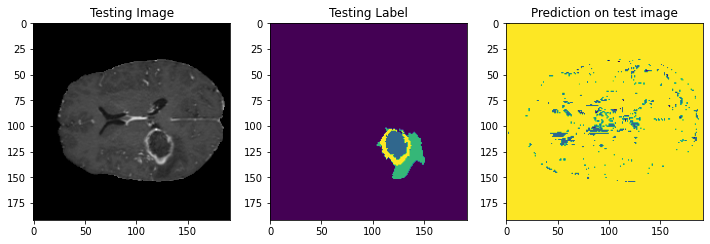

In [14]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 70
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()

In [15]:
#IOU
y_pred1=model1.predict(img1)
y_pred1_argmax=np.argmax(msk1, axis=3)


#Using built in keras function
from keras.metrics import MeanIoU
n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(msk1[:,:,:,0], y_pred1_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


Mean IoU = 0.0


In [21]:

import random
test_img_number = random.randint(0, len(img1))
test_img = img1[test_img_number]
ground_truth=msk1[test_img_number]
test_img_input=np.expand_dims(test_img, 0)

test_img_input1 = preprocess_input1(test_img_input)

test_pred1 = model1.predict(test_img_input1)
test_prediction1 = np.argmax(test_pred1, axis=3)[0,:,:]
test_img_input1 = test_img_input1.reshape(192,192,128,3)
ground_truth = ground_truth.reshape(192,192,128,4)
test_prediction1 = test_prediction1.reshape(192,192,128)

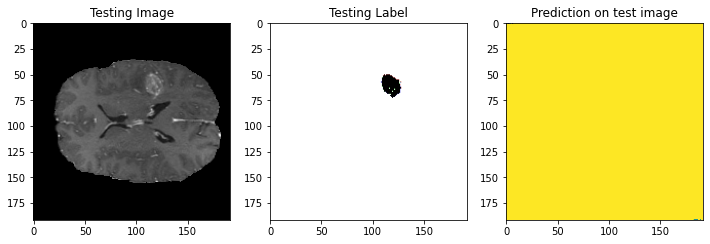

In [26]:


#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice =70
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img_input1[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction1[:,:, n_slice])
plt.show()

In [ ]:
train_images = []
train_masks = [] 

train_images.append(temp_combined_images)
train_masks.append(temp_mask)

temp_combined_images = temp_combined_images.reshape((temp_combined_images.shape[0]*temp_combined_images.shape[1]), temp_combined_images.shape[2], temp_combined_images.shape[3])
temp_mask = temp_mask.reshape((temp_mask.shape[0]*temp_mask.shape[1]), temp_mask.shape[2])

In [5]:
train_images = np.array(train_images)
train_masks = np.array(train_masks)

In [6]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
n, h, w = train_masks.shape
train_masks_reshaped = train_masks.reshape(-1,1)
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w)

np.unique(train_masks_encoded_original_shape)
train_masks_encoded_original_shape.shape

/home/jainy/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


(20, 36864, 128)

In [7]:

train_masks_input = np.expand_dims(train_masks_encoded_original_shape, axis=3)

#Create a subset of data for quick testing
#Picking 10% for testing and remaining for training
from sklearn.model_selection import train_test_split
X1, X_test, y1, y_test = train_test_split(train_images, train_masks_input, test_size = 0.10, random_state = 0)


print(y1.shape)
from tensorflow.keras.utils import to_categorical
train_masks_cat = to_categorical(y1, num_classes=n_classes)
print(train_masks_cat.shape)
y_train_cat = train_masks_cat.reshape((y1.shape[0], y1.shape[1], y1.shape[2], n_classes))



test_masks_cat = to_categorical(y_test, num_classes=n_classes)#Reused parameters in all models

y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))
print(y_test_cat.shape)

(18, 36864, 128, 1)
(18, 36864, 128, 4)
(2, 36864, 128, 4)


In [10]:
#Reused parameters in all models

n_classes=4
activation='softmax'

LR = 0.0001
optim = tf.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (car: 1.; pedestrian: 2.; background: 0.5;)
dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.25, 0.25, 0.25, 0.25])) 
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]


########################################################################
###Model 1
BACKBONE1 = 'efficientnetb0'
preprocess_input1 = sm.get_preprocessing(BACKBONE1)

# preprocess input
X_train1 = preprocess_input1(X1)
X_test1 = preprocess_input1(X_test)

# define model
import segmentation_models as sm

sm.set_framework('tf.keras')

sm.framework()
model1 = sm.Unet(BACKBONE1, encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model1.compile(optim, total_loss, metrics=metrics)

#model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)

print(model1.summary())




2022-05-05 13:28:25.243493: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-05 13:28:25.243675: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/jainy/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-05-05 13:28:25.243731: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/jainy/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-05-05 13:28:25.243772: W tensorflow/stream_exec

16818176/16804768 [==============================] - 111s 7us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 stem_conv (Conv2D)             (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 stem_bn (BatchNormalization)   (None, None, None,   128         ['stem_conv[0][0]']              
                           

                                                                                                  
 block2b_expand_bn (BatchNormal  (None, None, None,   576        ['block2b_expand_conv[0][0]']    
 ization)                       144)                                                              
                                                                                                  
 block2b_expand_activation (Act  (None, None, None,   0          ['block2b_expand_bn[0][0]']      
 ivation)                       144)                                                              
                                                                                                  
 block2b_dwconv (DepthwiseConv2  (None, None, None,   1296       ['block2b_expand_activation[0][0]
 D)                             144)                             ']                               
                                                                                                  
 block2b_b

 ivation)                       240)                                                              
                                                                                                  
 block3b_dwconv (DepthwiseConv2  (None, None, None,   6000       ['block3b_expand_activation[0][0]
 D)                             240)                             ']                               
                                                                                                  
 block3b_bn (BatchNormalization  (None, None, None,   960        ['block3b_dwconv[0][0]']         
 )                              240)                                                              
                                                                                                  
 block3b_activation (Activation  (None, None, None,   0          ['block3b_bn[0][0]']             
 )                              240)                                                              
          

 block4b_bn (BatchNormalization  (None, None, None,   1920       ['block4b_dwconv[0][0]']         
 )                              480)                                                              
                                                                                                  
 block4b_activation (Activation  (None, None, None,   0          ['block4b_bn[0][0]']             
 )                              480)                                                              
                                                                                                  
 block4b_se_squeeze (GlobalAver  (None, 480)         0           ['block4b_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block4b_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block4b_se_squeeze[0][0]']     
          

                                                                                                  
 block5a_bn (BatchNormalization  (None, None, None,   1920       ['block5a_dwconv[0][0]']         
 )                              480)                                                              
                                                                                                  
 block5a_activation (Activation  (None, None, None,   0          ['block5a_bn[0][0]']             
 )                              480)                                                              
                                                                                                  
 block5a_se_squeeze (GlobalAver  (None, 480)         0           ['block5a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5a_s

 )                              672)                                                              
                                                                                                  
 block5c_se_squeeze (GlobalAver  (None, 672)         0           ['block5c_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5c_se_reshape (Reshape)   (None, 1, 1, 672)    0           ['block5c_se_squeeze[0][0]']     
                                                                                                  
 block5c_se_reduce (Conv2D)     (None, 1, 1, 28)     18844       ['block5c_se_reshape[0][0]']     
                                                                                                  
 block5c_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block5c_se_reduce[0][0]']      
          

 block6b_se_reshape (Reshape)   (None, 1, 1, 1152)   0           ['block6b_se_squeeze[0][0]']     
                                                                                                  
 block6b_se_reduce (Conv2D)     (None, 1, 1, 48)     55344       ['block6b_se_reshape[0][0]']     
                                                                                                  
 block6b_se_expand (Conv2D)     (None, 1, 1, 1152)   56448       ['block6b_se_reduce[0][0]']      
                                                                                                  
 block6b_se_excite (Multiply)   (None, None, None,   0           ['block6b_activation[0][0]',     
                                1152)                             'block6b_se_expand[0][0]']      
                                                                                                  
 block6b_project_conv (Conv2D)  (None, None, None,   221184      ['block6b_se_excite[0][0]']      
          

                                                                                                  
 block6d_se_reshape (Reshape)   (None, 1, 1, 1152)   0           ['block6d_se_squeeze[0][0]']     
                                                                                                  
 block6d_se_reduce (Conv2D)     (None, 1, 1, 48)     55344       ['block6d_se_reshape[0][0]']     
                                                                                                  
 block6d_se_expand (Conv2D)     (None, 1, 1, 1152)   56448       ['block6d_se_reduce[0][0]']      
                                                                                                  
 block6d_se_excite (Multiply)   (None, None, None,   0           ['block6d_activation[0][0]',     
                                1152)                             'block6d_se_expand[0][0]']      
                                                                                                  
 block6d_p

                                                                                                  
 decoder_stage0b_conv (Conv2D)  (None, None, None,   589824      ['decoder_stage0a_relu[0][0]']   
                                256)                                                              
                                                                                                  
 decoder_stage0b_bn (BatchNorma  (None, None, None,   1024       ['decoder_stage0b_conv[0][0]']   
 lization)                      256)                                                              
                                                                                                  
 decoder_stage0b_relu (Activati  (None, None, None,   0          ['decoder_stage0b_bn[0][0]']     
 on)                            256)                                                              
                                                                                                  
 decoder_s

 lization)                      32)                                                               
                                                                                                  
 decoder_stage3b_relu (Activati  (None, None, None,   0          ['decoder_stage3b_bn[0][0]']     
 on)                            32)                                                               
                                                                                                  
 decoder_stage4_upsampling (UpS  (None, None, None,   0          ['decoder_stage3b_relu[0][0]']   
 ampling2D)                     32)                                                               
                                                                                                  
 decoder_stage4a_conv (Conv2D)  (None, None, None,   4608        ['decoder_stage4_upsampling[0][0]
                                16)                              ']                               
          

In [11]:
print(X1.shape)
print(y_train_cat.shape)
history1=model1.fit(X1, 
          y_train_cat,
          batch_size=8, 
          epochs=1,
          verbose=1,
          validation_data=(X_test1, y_test_cat))


model1.save('res34_backbone_50epochs.hdf5')

(18, 36864, 128, 3)
(18, 36864, 128, 4)


2022-05-05 13:42:32.018740: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6039797760 exceeds 10% of free system memory.
2022-05-05 13:47:04.152208: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 5435817984 exceeds 10% of free system memory.
2022-05-05 13:47:04.152541: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 5435817984 exceeds 10% of free system memory.
2022-05-05 13:47:23.409022: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6039797760 exceeds 10% of free system memory.
2022-05-05 13:47:23.409656: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 6794772480 exceeds 10% of free system memory.


3/3 [==============================] - 2074s 449s/step - loss: 1.0406 - iou_score: 0.0140 - f1-score: 0.0278 - val_loss: 1.1656 - val_iou_score: 0.0020 - val_f1-score: 0.0040


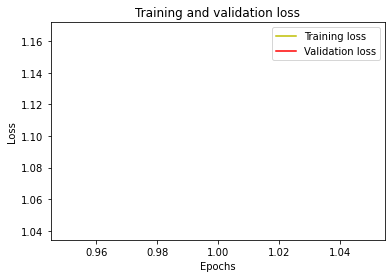

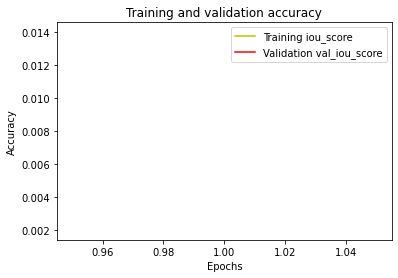

In [16]:
loss = history1.history['loss']
val_loss = history1.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

iou_score = history1.history['iou_score']
val_iou_score = history1.history['val_iou_score']

plt.plot(epochs, iou_score, 'y', label='Training iou_score')
plt.plot(epochs, val_iou_score, 'r', label='Validation val_iou_score')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [18]:
#IOU
y_pred1=model1.predict(X_test)
y_pred1_argmax=np.argmax(y_pred1, axis=3)


#Using built in keras function
#from keras.metrics import MeanIoU
n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_test[:,:,:,0], y_pred1_argmax)
print("Mean IoU =", IOU_keras.result().numpy())



Mean IoU = 0.0019810917


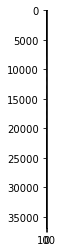

In [19]:
plt.imshow(train_images[0, :,:,0], cmap='gray')
plt.imshow(train_masks[0], cmap='gray')

In [61]:

import random
test_img_number = random.randint(0, len(X_test1))
test_img = X_test1[test_img_number]
ground_truth=y_test[test_img_number]
test_img_input=np.expand_dims(test_img, 0)

test_img_input1 = preprocess_input1(test_img_input)

test_pred1 = model1.predict(test_img_input1)
test_prediction1 = np.argmax(test_pred1, axis=3)[0,:,:]
test_img_input1 = test_img_input1.reshape(192,192,128,3)
ground_truth = ground_truth.reshape(192,192,128)
test_prediction1 = test_prediction1.reshape(192,192,128)

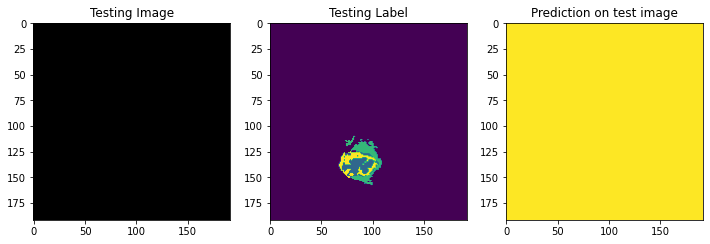

In [70]:


#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice =51
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img_input1[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction1[:,:, n_slice])
plt.show()

TypeError: Invalid shape (192, 192, 128) for image data

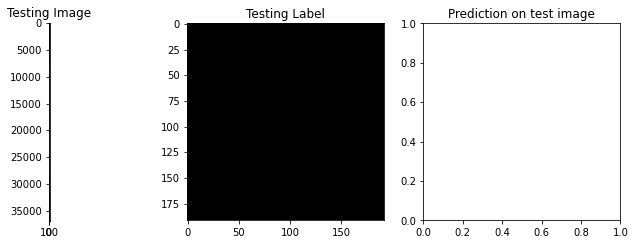

In [31]:
#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 83

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")
test_mask_argmax=np.argmax(test_mask, axis=3)

test_img_input = np.expand_dims(test_img, axis=0)
test_prediction = my_model.predict(test_img_input)
test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))



In [35]:
import splitfolders  

input_folder = 'brats20-dataset-training-validation/BraTS2020_TrainingData/miccai_/'
output_folder = 'brats20-dataset-training-validation/BraTS2020_TrainingData/miccai__/'

splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(.75, .25), group_prefix=None) # default values

Copying files: 40 files [00:22,  1.77 files/s]


In [3]:
import os
import numpy as np


def load_img(img_dir, img_list):
    images=[]
    for i, image_name in enumerate(img_list):    
        if (image_name.split('.')[1] == 'npy'):
            
            image = np.load(img_dir+image_name)
                      
            images.append(image)
    images = np.array(images)
    
    return(images)




def imageLoader(img_dir, img_list, mask_dir, mask_list, batch_size):

    L = len(img_list)

      
    while True:

        batch_start = 0
        batch_end = batch_size

        while batch_start < L:
            limit = min(batch_end, L)
                       
            X = load_img(img_dir, img_list[batch_start:limit])
            Y = load_img(mask_dir, mask_list[batch_start:limit])

            yield (X,Y)      

            batch_start += batch_size   
            batch_end += batch_size

In [6]:



from matplotlib import pyplot as plt
import random

train_img_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/miccai__/train/images/"
train_mask_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/miccai__/train/masks/"
train_img_list=os.listdir(train_img_dir)
train_mask_list = os.listdir(train_mask_dir)

batch_size = 2



AttributeError: 'str' object has no attribute 'shape'

In [ ]:
train_img_datagen = imageLoader(train_img_dir, train_img_list, 
                                train_mask_dir, train_mask_list, batch_size)


img, msk = train_img_datagen.__next__()


img_num = random.randint(0,img.shape[0]-1)
test_img=img[img_num]
test_img = test_img.reshape(192,192,128,3)
test_mask=msk[img_num]
test_mask = test_mask.reshape(192,192,128,4)
test_mask=np.argmax(test_mask, axis=3)
 
n_slice=random.randint(0, test_mask.shape[2])
plt.figure(figsize=(12, 8))

plt.subplot(221)
plt.imshow(test_img[:,:,n_slice, 0], cmap='gray')
plt.title('Image flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice, 1], cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice, 2], cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice])
plt.title('Mask')
plt.show()

In [6]:
###------------------------------------------------###
###------------------------------------------------###
import matplotlib.pyplot as plt
import numpy as np
from skimage.transform import rotate
from skimage.feature import local_binary_pattern
from skimage import data
from skimage.color import label2rgb
import nibabel as nib
import scipy.ndimage
from scipy import ndimage
from scipy.stats import itemfreq
import glob
import os
import re
import cv2
from skimage.filters import difference_of_gaussians, laplace
import matplotlib.pyplot as plt
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.feature import hog
from skimage import data, exposure
import numpy as np
from scipy import ndimage as img
from scipy import io as sio
import matplotlib.pyplot as plt
import pyshearlab
from matplotlib.pyplot import imread
import seaborn as sns
import cv2

%matplotlib inline

In [7]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from tensorflow.keras.optimizers import Adam
from keras.metrics import MeanIoU

kernel_initializer =  'he_uniform' 



def simple_unet_model(IMG_HEIGHT_WIDTH, IMG_DEPTH, IMG_CHANNELS, num_classes):

    inputs = Input((IMG_HEIGHT_WIDTH, IMG_DEPTH, IMG_CHANNELS))
    
    s = inputs


    
    c1 = Conv2D(8, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(s)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(8, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(16, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(16, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
     
    c3 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
     
    c4 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)
     
    c5 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c5)
    
    #Expansive path 
    u6 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c6)
     
    u7 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c7)
     
    u8 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(16, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(16, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c8)
     
    u9 = Conv2DTranspose(8, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(8, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(8, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same')(c9)
     
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(c9)
     
    model = Model(inputs=[inputs], outputs=[outputs])
     
    model.summary()
    
    return model

 
model = simple_unet_model(36864, 128, 3, 4)
print(model.input_shape)
print(model.output_shape)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 36864, 128,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, 36864, 128,   224         ['input_1[0][0]']                
                                8)                                                                
                                                                                                  
 dropout (Dropout)              (None, 36864, 128,   0           ['conv2d[0][0]']                 
                                8)                                                            

 conv2d_12 (Conv2D)             (None, 9216, 32, 32  18464       ['concatenate_1[0][0]']          
                                )                                                                 
                                                                                                  
 dropout_6 (Dropout)            (None, 9216, 32, 32  0           ['conv2d_12[0][0]']              
                                )                                                                 
                                                                                                  
 conv2d_13 (Conv2D)             (None, 9216, 32, 32  9248        ['dropout_6[0][0]']              
                                )                                                                 
                                                                                                  
 conv2d_transpose_2 (Conv2DTran  (None, 18432, 64, 1  2064       ['conv2d_13[0][0]']              
 spose)   

2022-05-05 11:09:43.818391: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-05 11:09:43.818567: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/jainy/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-05-05 11:09:43.818619: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/jainy/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:/usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-05-05 11:09:43.818660: W tensorflow/stream_exec

In [8]:
import visualkeras



visualkeras.layered_view(model).show() # display using your system viewer
visualkeras.layered_view(model, to_file='output.png') # write to disk
visualkeras.layered_view(model, to_file='output.png').show() # write and show

In [9]:
train_img_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/miccai__/train/images/"
train_mask_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/miccai__/train/masks/"

val_img_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/miccai__/val/images/"
val_mask_dir = "brats20-dataset-training-validation/BraTS2020_TrainingData/miccai__/val/masks/"

train_img_list=os.listdir(train_img_dir)
train_mask_list = os.listdir(train_mask_dir)

val_img_list=os.listdir(val_img_dir)
val_mask_list = os.listdir(val_mask_dir)


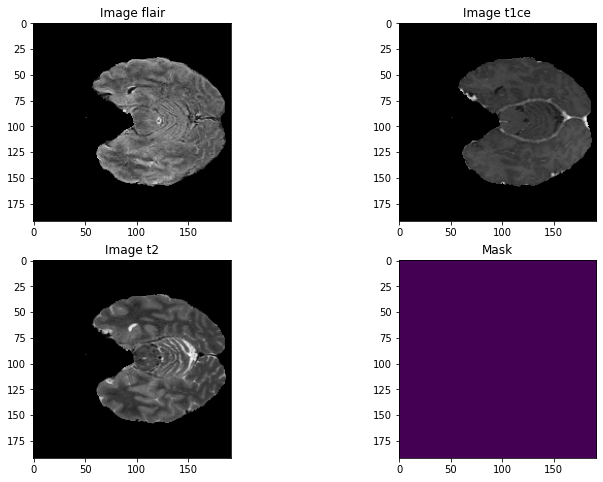

In [10]:
batch_size = 2

train_img_datagen = imageLoader(train_img_dir, train_img_list, 
                                train_mask_dir, train_mask_list, batch_size)

val_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)


img, msk = train_img_datagen.__next__()

img_num = random.randint(0,img.shape[0]-1)
test_img=img[img_num]
test_img = test_img.reshape(192,192,128,3)
test_mask=msk[img_num]
test_mask = test_mask.reshape(192,192,128,4)
test_mask=np.argmax(test_mask, axis=3)

n_slice=random.randint(0, test_mask.shape[2])
plt.figure(figsize=(12, 8))

plt.subplot(221)
plt.imshow(test_img[:,:,n_slice, 0], cmap='gray')
plt.title('Image flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice, 1], cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice, 2], cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice])
plt.title('Mask')
plt.show()

In [11]:
#Define loss, metrics and optimizer to be used for training
wt0, wt1, wt2, wt3 = 0.25,0.25,0.25,0.25
import segmentation_models as sm
from tensorflow.keras.optimizers import Adam

dice_loss = sm.losses.DiceLoss(class_weights=np.array([wt0, wt1, wt2, wt3])) 
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

metrics = ['accuracy', sm.metrics.IOUScore(threshold=0.5)]

LR = 0.0001
optim = Adam(LR)

Segmentation Models: using `keras` framework.


In [12]:
steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size



BACKBONE2 = 'inceptionv3'
preprocess_input2 = sm.get_preprocessing(BACKBONE2)

# preprocess input
X_train2 = preprocess_input2(X_train)
X_test2 = preprocess_input2(X_test)

# define model
model2 = sm.Unet(BACKBONE2, encoder_weights='imagenet', classes=n_classes, activation=activation)

model2.compile(optimizer = optim, loss=total_loss, metrics=metrics)
print(model.summary())

print(model.input_shape)
print(model.output_shape)

NameError: name 'X_train' is not defined

In [64]:


BACKBONE2 = 'inceptionv3'
preprocess_input2 = sm.get_preprocessing(BACKBONE2)

# preprocess input
X_train2 = preprocess_input2(X_train)
X_test2 = preprocess_input2(X_test)

# define model
model2 = sm.Unet(BACKBONE2, encoder_weights='imagenet', classes=n_classes, activation=activation)


# compile keras model with defined optimozer, loss and metrics
model2.compile(optim, total_loss, metrics)
#model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)


print(model2.summary())


history2=model2.fit(X_train2, 
          y_train_cat,
          batch_size=8, 
          epochs=50,
          verbose=1,
          validation_data=(X_test2, y_test_cat))




model.save('miccai.hdf5')

Epoch 1/20
7/7 [==============================] - 70s 10s/step - loss: 1.0247 - accuracy: 0.4021 - iou_score: 4.3175e-10 - val_loss: 1.0229 - val_accuracy: 0.5577 - val_iou_score: 2.1106e-10
Epoch 2/20
7/7 [==============================] - 82s 12s/step - loss: 1.0240 - accuracy: 0.5068 - iou_score: 4.3550e-10 - val_loss: 1.0222 - val_accuracy: 0.5984 - val_iou_score: 2.1106e-10
Epoch 3/20
7/7 [==============================] - 90s 13s/step - loss: 1.0233 - accuracy: 0.5699 - iou_score: 3.4275e-10 - val_loss: 1.0217 - val_accuracy: 0.6608 - val_iou_score: 2.1106e-10
Epoch 4/20
7/7 [==============================] - 86s 13s/step - loss: 1.0230 - accuracy: 0.6082 - iou_score: 4.7284e-10 - val_loss: 1.0212 - val_accuracy: 0.7240 - val_iou_score: 2.1106e-10
Epoch 5/20
7/7 [==============================] - 86s 12s/step - loss: 1.0222 - accuracy: 0.6347 - iou_score: 4.1856e-10 - val_loss: 1.0209 - val_accuracy: 0.7494 - val_iou_score: 2.1106e-10
Epoch 6/20
7/7 [=============================

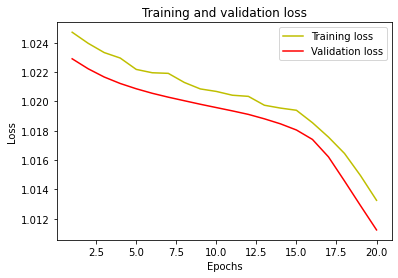

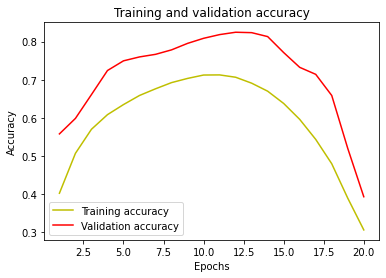

In [65]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

plt.plot(epochs, acc, 'y', label='Training accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [66]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 16

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/miccai__/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/miccai__/val/masks/mask_"+str(img_num)+".npy")
test_mask_argmax=np.argmax(test_mask, axis=2)

test_img_input = np.expand_dims(test_img, axis=0)
test_prediction = model.predict(test_img_input)
test_prediction_argmax=np.argmax(test_prediction, axis=3)[0,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))





Mean IoU = 0.09999139


IndexError: too many indices for array: array is 3-dimensional, but 4 were indexed

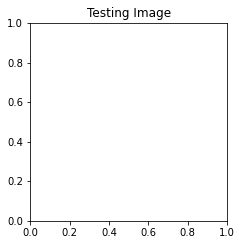

In [67]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 50
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


In [13]:
from keras.models import load_model

#Load model for prediction or continue training

#For continuing training....
#The following gives an error: Unknown loss function: dice_loss_plus_1focal_loss
#This is because the model does not save loss function and metrics. So to compile and 
#continue training we need to provide these as custom_objects.
#my_model = load_model('Seg_BraTS_3d.hdf5')

#So let us add the loss as custom object... but the following throws another error...
#Unknown metric function: iou_score
#my_model = load_model('saved_models/brats_3d_100epochs_simple_unet_weighted_dice.hdf5', 
                     # custom_objects={'dice_loss_plus_1focal_loss': total_loss})

#Now, let us add the iou_score function we used during our initial training
my_model = load_model('Seg_BraTS_3d.hdf5', 
                      custom_objects={'dice_loss_plus_1focal_loss': total_loss,
                                      'iou_score':sm.metrics.IOUScore(threshold=0.5)})

#Now all set to continue the training process. 
history2=my_model.fit(train_img_datagen,
          steps_per_epoch=steps_per_epoch,
          epochs=5,
          verbose=1,
          validation_data=val_img_datagen,
          validation_steps=val_steps_per_epoch,
          )

Epoch 1/5


2022-04-14 17:42:20.930368: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 8153726976 exceeds 10% of free system memory.
2022-04-14 17:42:20.930426: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 8153726976 exceeds 10% of free system memory.
2022-04-14 17:42:28.940571: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 16307453952 exceeds 10% of free system memory.
2022-04-14 17:42:28.940636: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 16307453952 exceeds 10% of free system memory.
2022-04-14 17:43:13.340680: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 8153726976 exceeds 10% of free system memory.


138/138 [==============================] - 9642s 70s/step - loss: 0.8691 - accuracy: 0.9831 - iou_score: 0.4536 - val_loss: 0.8987 - val_accuracy: 0.9540 - val_iou_score: 0.3735
Epoch 2/5
138/138 [==============================] - 9676s 70s/step - loss: 0.8678 - accuracy: 0.9835 - iou_score: 0.4565 - val_loss: 0.8863 - val_accuracy: 0.9663 - val_iou_score: 0.4044
Epoch 3/5
138/138 [==============================] - 9671s 70s/step - loss: 0.8605 - accuracy: 0.9852 - iou_score: 0.4793 - val_loss: 0.8827 - val_accuracy: 0.9661 - val_iou_score: 0.4153
Epoch 4/5
138/138 [==============================] - 9672s 70s/step - loss: 0.8557 - accuracy: 0.9859 - iou_score: 0.4956 - val_loss: 0.8813 - val_accuracy: 0.9674 - val_iou_score: 0.4221
Epoch 5/5
138/138 [==============================] - 9674s 70s/step - loss: 0.8550 - accuracy: 0.9856 - iou_score: 0.4989 - val_loss: 0.8574 - val_accuracy: 0.9834 - val_iou_score: 0.4907


In [14]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=4)
test_pred_batch = my_model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=4)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 83

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")
test_mask_argmax=np.argmax(test_mask, axis=3)

test_img_input = np.expand_dims(test_img, axis=0)
test_prediction = my_model.predict(test_img_input)
test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))





Mean IoU = 0.54191756


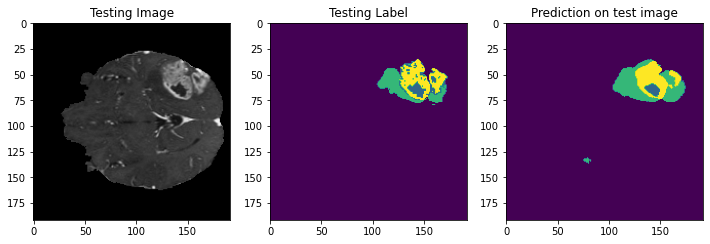

In [18]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 50
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


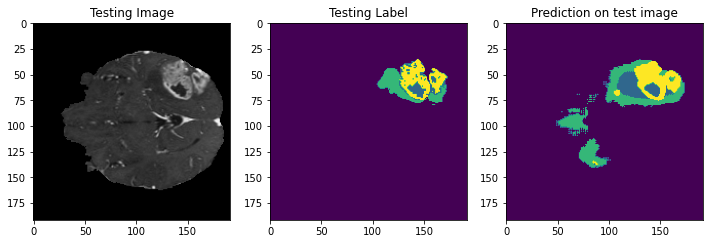

In [37]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 50
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


In [73]:
from keras.models import load_model
model = load_model('6junetoday.hdf5', 
                      compile=False)

ValueError: Unknown layer: FixedDropout. Please ensure this object is passed to the `custom_objects` argument. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

In [12]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=4)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=4)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.050113752


In [13]:
img_num = 61

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")
test_mask_argmax=np.argmax(test_mask, axis=3)

test_img_input = np.expand_dims(test_img, axis=0)
test_prediction = model.predict(test_img_input)
test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))




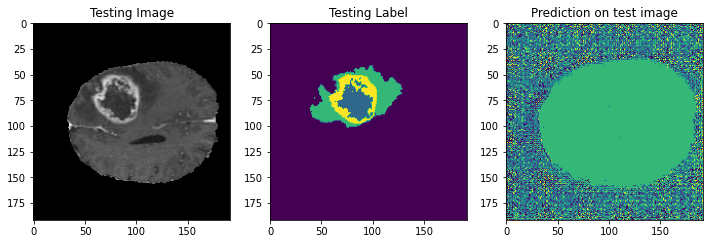

In [15]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 85
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


In [ ]:
from keras.models import load_model

#Load model for prediction or continue training

#For continuing training....
#The following gives an error: Unknown loss function: dice_loss_plus_1focal_loss
#This is because the model does not save loss function and metrics. So to compile and 
#continue training we need to provide these as custom_objects.
#my_model = load_model('Seg_BraTS_3d.hdf5')

#So let us add the loss as custom object... but the following throws another error...
#Unknown metric function: iou_score
#my_model = load_model('saved_models/brats_3d_100epochs_simple_unet_weighted_dice.hdf5', 
                     # custom_objects={'dice_loss_plus_1focal_loss': total_loss})

#Now, let us add the iou_score function we used during our initial training
model = load_model('Seg_BraTS_3d.hdf5', 
                      custom_objects={'dice_loss_plus_1focal_loss': total_loss,
                                      'iou_score':sm.metrics.IOUScore(threshold=0.5)})

#Now all set to continue the training process. 
history3=model.fit(train_img_datagen,
          steps_per_epoch=steps_per_epoch,
          epochs=15,
          verbose=1,
          validation_data=val_img_datagen,
          validation_steps=val_steps_per_epoch,
          )

Epoch 1/15


2022-04-16 09:22:54.705884: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 8153726976 exceeds 10% of free system memory.
2022-04-16 09:22:54.705942: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 8153726976 exceeds 10% of free system memory.
2022-04-16 09:23:02.774440: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 16307453952 exceeds 10% of free system memory.
2022-04-16 09:23:02.774499: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 16307453952 exceeds 10% of free system memory.
2022-04-16 09:23:47.343723: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 8153726976 exceeds 10% of free system memory.


138/138 [==============================] - 9654s 70s/step - loss: 0.8683 - accuracy: 0.9839 - iou_score: 0.4560 - val_loss: 0.8870 - val_accuracy: 0.9654 - val_iou_score: 0.4021
Epoch 2/15
138/138 [==============================] - 9671s 70s/step - loss: 0.8635 - accuracy: 0.9847 - iou_score: 0.4701 - val_loss: 0.8896 - val_accuracy: 0.9588 - val_iou_score: 0.3972
Epoch 3/15
138/138 [==============================] - 9666s 70s/step - loss: 0.8594 - accuracy: 0.9851 - iou_score: 0.4834 - val_loss: 0.8757 - val_accuracy: 0.9703 - val_iou_score: 0.4358
Epoch 4/15
138/138 [==============================] - 9675s 70s/step - loss: 0.8545 - accuracy: 0.9859 - iou_score: 0.5002 - val_loss: 0.8794 - val_accuracy: 0.9651 - val_iou_score: 0.4281
Epoch 5/15
138/138 [==============================] - 9673s 70s/step - loss: 0.8519 - accuracy: 0.9863 - iou_score: 0.5082 - val_loss: 0.8827 - val_accuracy: 0.9609 - val_iou_score: 0.4213
Epoch 6/15
138/138 [==============================] - 9679s 70s/st

In [ ]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=4)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=4)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 83

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")
test_mask_argmax=np.argmax(test_mask, axis=3)

test_img_input = np.expand_dims(test_img, axis=0)
test_prediction = model.predict(test_img_input)
test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))




In [ ]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 50
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


In [9]:
from keras.models import load_model
model = load_model('6junetoday.hdf5', 
                      compile=False)

ValueError: Unknown layer: FixedDropout. Please ensure this object is passed to the `custom_objects` argument. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

In [12]:
from keras.metrics import MeanIoU

batch_size=8 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=4)
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=4)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

#############################################
#Predict on a few test images, one at a time
#Try images: 
img_num = 83

test_img = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/images/image_"+str(img_num)+".npy")

test_mask = np.load("brats20-dataset-training-validation/BraTS2020_TrainingData/input_data_1284/val/masks/mask_"+str(img_num)+".npy")
test_mask_argmax=np.argmax(test_mask, axis=3)

test_img_input = np.expand_dims(test_img, axis=0)
test_prediction = model.predict(test_img_input)
test_prediction_argmax=np.argmax(test_prediction, axis=4)[0,:,:,:]


# print(test_prediction_argmax.shape)
# print(test_mask_argmax.shape)
# print(np.unique(test_prediction_argmax))




AxisError: axis 4 is out of bounds for array of dimension 4

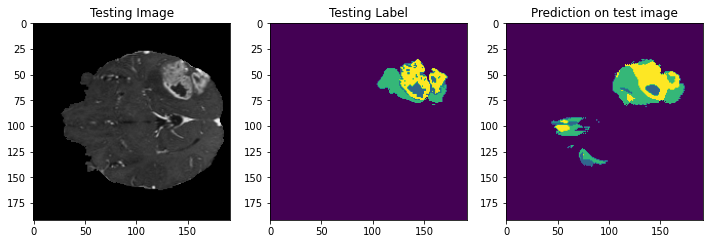

In [15]:
#Plot individual slices from test predictions for verification
from matplotlib import pyplot as plt
import random

#n_slice=random.randint(0, test_prediction_argmax.shape[2])
n_slice = 50
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:, n_slice])
plt.show()


a


In [1]:
import tensorflow as tf

from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt

2022-05-16 17:04:11.347845: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-05-16 17:04:11.347868: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [18]:
from SE import squeeze_excitation_layer
from torch import nn
from tensorflow.keras.layers import Dense

In [21]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.GlobalAveragePooling2D())
model.add(Dense(128,activation = 'relu'))
model.add(Dense(128,activation = 'sigmoid'))
    


In [22]:
130def Efficient_ResidualUNet(input_shape):
    backbone = efn.EfficientNetB0(
        weights=None,
        include_top=False,
        input_shape=input_shape
    )
    
    backbone.load_weights(('../input/efficientnet-keras-weights-b0b5/'
                           'efficientnet-b0_imagenet_1000_notop.h5'))
    
    # Skipping block 4f and block 6h since they have the same output dim as 5f and 7b
    x00 = backbone.input  # (256, 512, 3)

In [4]:
import efficientnet.keras as efn
input_shape = (256,256,3)
from tensorflow.keras.applications import EfficientNetB4

In [5]:
backbone = EfficientNetB0(weights='imagenet',include_top=False,input_shape=input_shape)
    

NameError: name 'EfficientNetB0' is not defined

In [6]:
x= backbone.output

y = backbone.input

NameError: name 'backbone' is not defined

In [1]:
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Activation, Flatten, concatenate, Conv2DTranspose
from keras.layers import Conv2D, MaxPooling2D

In [2]:
conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(conv1)
conc1 = concatenate([x, conv1], axis=3)
pool1 = MaxPooling2D(pool_size=(2, 2))(conc1)

conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(pool1)
conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv2)
conc2 = concatenate([pool1, conv2], axis=3)
pool2 = MaxPooling2D(pool_size=(2, 2))(conc2)

conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool2)
conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)
conc3 = concatenate([pool2, conv3], axis=3)
pool3 = MaxPooling2D(pool_size=(2, 2))(conc3)

conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool3)
conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv4)
conc4 = concatenate([pool3, conv4], axis=3)
pool4 = MaxPooling2D(pool_size=(2, 2))(conc4)

conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool4)
conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
conc5 = concatenate([pool4, conv5], axis=3)

up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conc5), conv4], axis=3)
conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(up6)
conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
conc6 = concatenate([up6, conv6], axis=3)

up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conc6), conv3], axis=3)
conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(up7)
conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
conc7 = concatenate([up7, conv7], axis=3)

up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conc7), conv2], axis=3)
conv8 = Conv2D(32, (3, 3), activation='relu', padding='same')(up8)
conv8 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv8)
conc8 = concatenate([up8, conv8], axis=3)

up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conc8), conv1], axis=3)
conv9 = Conv2D(16, (3, 3), activation='relu', padding='same')(up9)
conv9 = Conv2D(16, (3, 3), activation='relu', padding='same')(conv9)
conc9 = concatenate([up9, conv9], axis=3)

conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conc9)

model = Model(inputs=[inputs], outputs=[conv10])

model.summary()

NameError: name 'x' is not defined

In [3]:
conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(conv1)
conc1 = concatenate([x, conv1], axis=3)
pool1 = MaxPooling2D(pool_size=(2, 2))(conc1)

conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(pool1)
conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv2)
conc2 = concatenate([pool1, conv2], axis=3)
pool2 = MaxPooling2D(pool_size=(2, 2))(conc2)

conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool2)
conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)
conc3 = concatenate([pool2, conv3], axis=3)
pool3 = MaxPooling2D(pool_size=(2, 2))(conc3)

conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool3)
conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv4)
conc4 = concatenate([pool3, conv4], axis=3)


up5 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conc4), conv3], axis=3)
conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(up5)
conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv5)
conc5 = concatenate([up5, conv5], axis=3)

up6 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conc5), conv2], axis=3)
conv6 = Conv2D(32, (3, 3), activation='relu', padding='same')(up6)
conv6 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv6)
conc6 = concatenate([up6, conv6], axis=3)

up7 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conc6), conv1], axis=3)
conv7 = Conv2D(16, (3, 3), activation='relu', padding='same')(up7)
conv7 = Conv2D(16, (3, 3), activation='relu', padding='same')(conv7)
conc7 = concatenate([up7, conv7], axis=3)

conv8 = Conv2D(4, (1, 1), activation='softmax')(conc7)

model = Model(inputs=[y], outputs=[conv8])

model.summary()

NameError: name 'x' is not defined

In [1]:
from keras.layers import LeakyReLU, MaxPooling2D, Dropout, Conv2D, concatenate, Conv2DTranspose, BatchNormalization, Activation,Add

2022-10-20 16:06:21.634444: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-10-20 16:06:21.634461: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
def convolution_block(x, filters, size, strides=(1,1), padding='same', activation=True):
    x = Conv2D(filters, size, strides=strides, padding=padding)(x)
    x = BatchNormalization()(x)
    if activation == True:
        x = LeakyReLU(alpha=0.1)(x)
    return x

def residual_block(blockInput, num_filters=16):
    x = LeakyReLU(alpha=0.1)(blockInput)
    x = BatchNormalization()(x)
    blockInput = BatchNormalization()(blockInput)
    x = convolution_block(x, num_filters, (3,3) )
    x = convolution_block(x, num_filters, (3,3), activation=False)
    x = Add()([x, blockInput])
    return x

In [6]:


def UEfficientNet(input_shape=(None, None, 3),dropout_rate=0.1):


    backbone = EfficientNetB4(weights='imagenet',
                        include_top=False,
                        input_shape=input_shape)
    input = backbone.input
    start_neurons = 8
    conv4 = backbone.layers[342].output
    conv4 = LeakyReLU(alpha=0.1)(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(dropout_rate)(pool4)

    # Middle
    convm = Conv2D(start_neurons * 32, (3, 3), activation=None, padding="same",name='conv_middle')(pool4)
    convm = residual_block(convm,start_neurons * 32)
    convm = residual_block(convm,start_neurons * 32)
    convm = LeakyReLU(alpha=0.1)(convm)

    deconv4 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(convm)
    deconv4_up1 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(deconv4)
    deconv4_up2 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(deconv4_up1)
    deconv4_up3 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(deconv4_up2)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(dropout_rate)(uconv4) 

    uconv4 = Conv2D(start_neurons * 16, (3, 3), activation=None, padding="same")(uconv4)
    uconv4 = residual_block(uconv4,start_neurons * 16)
    #     uconv4 = residual_block(uconv4,start_neurons * 16)
    uconv4 = LeakyReLU(alpha=0.1)(uconv4)  #conv1_2

    deconv3 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(uconv4)
    deconv3_up1 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(deconv3)
    deconv3_up2 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(deconv3_up1)
    conv3 = backbone.layers[152].output
    uconv3 = concatenate([deconv3,deconv4_up1, conv3])    
    uconv3 = Dropout(dropout_rate)(uconv3)

    uconv3 = Conv2D(start_neurons * 8, (3, 3), activation=None, padding="same")(uconv3)
    uconv3 = residual_block(uconv3,start_neurons * 8)
    #     uconv3 = residual_block(uconv3,start_neurons * 8)
    uconv3 = LeakyReLU(alpha=0.1)(uconv3)

    deconv2 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv3)
    deconv2_up1 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(deconv2)
    conv2 = backbone.layers[92].output
    uconv2 = concatenate([deconv2,deconv3_up1,deconv4_up2, conv2])

    uconv2 = Dropout(0.1)(uconv2)
    uconv2 = Conv2D(start_neurons * 4, (3, 3), activation=None, padding="same")(uconv2)
    uconv2 = residual_block(uconv2,start_neurons * 4)
    #     uconv2 = residual_block(uconv2,start_neurons * 4)
    uconv2 = LeakyReLU(alpha=0.1)(uconv2)

    deconv1 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv2)
    print(deconv1.shape)
    conv1 = backbone.layers[34].output
    uconv1 = concatenate([deconv1,deconv2_up1,deconv3_up2,deconv4_up3, conv1])

    uconv1 = Dropout(0.1)(uconv1)
    uconv1 = Conv2D(start_neurons * 2, (3, 3), activation=None, padding="same")(uconv1)
    uconv1 = residual_block(uconv1,start_neurons * 2)
    #     uconv1 = residual_block(uconv1,start_neurons * 2)
    uconv1 = LeakyReLU(alpha=0.1)(uconv1)

    uconv0 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uconv1)   
    uconv0 = Dropout(0.1)(uconv0)
    uconv0 = Conv2D(start_neurons * 1, (3, 3), activation=None, padding="same")(uconv0)
    uconv0 = residual_block(uconv0,start_neurons * 1)
    #     uconv0 = residual_block(uconv0,start_neurons * 1)
    uconv0 = LeakyReLU(alpha=0.1)(uconv0)
    uconv0 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uconv0)

    output_layer = Conv2D(4, (1,1), padding="same", activation="sigmoid")(uconv0)    

    model = Model(input, output_layer)
    
    return model

In [7]:
img_size = 256
model = UEfficientNet(input_shape=(img_size,img_size,3),dropout_rate=0.5)
model.summary()

2022-10-20 16:06:46.051499: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-20 16:06:46.051708: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-10-20 16:06:46.051761: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-10-20 16:06:46.051801: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open 

ValueError: A `Concatenate` layer requires inputs with matching shapes except for the concatenation axis. Received: input_shape=[(None, 32, 32, 32), (None, 32, 32, 64), (None, 32, 32, 128), (None, 67, 67, 192)]

In [105]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='Den_model.jpg', show_shapes=True, show_layer_names=True)

In [9]:
import visualkeras


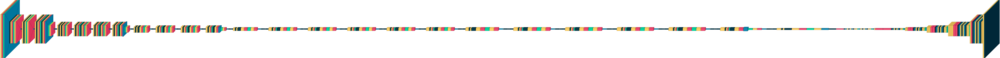

In [109]:
visualkeras.layered_view(model)

In [57]:
from keras.models import Sequential, Model

In [47]:
dropout_rate=0.1

(None, 64, 64, 32)


In [7]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model

def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, 2, strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # print(s1.shape, s2.shape, s3.shape, s4.shape)
    # print(p1.shape, p2.shape, p3.shape, p4.shape)

    b1 = conv_block(p4, 1024)
    b2 = conv_block(b1, 1024)

    d1 = decoder_block(b2, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)
    

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="UNET")
    return model

if __name__ == "__main__":
    input_shape = (256, 256, 3)
    model = build_unet(input_shape)
    model.summary()
    

2022-11-15 15:28:17.764320: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-15 15:28:17.887842: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudnn.so.8'; dlerror: libcudnn.so.8: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-11-15 15:28:17.887858: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1934] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2022-11-15 15:28:17.888408: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFl

TypeError: 'module' object is not callable

In [1]:
import visualkeras
visualkeras.layered_view(model)

2022-11-11 17:49:10.607706: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-11 17:49:10.966174: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-11 17:49:11.701842: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-11-11 17:49:11.701900: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: li

NameError: name 'model' is not defined

In [1]:
import tensorflow
from tensorflow.keras import layers

2022-11-15 15:27:40.896035: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-15 15:27:41.253200: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-15 15:27:42.092988: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.5/lib:/usr/local/cuda-11.5/lib64
2022-11-15 15:27:42.093042: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: li

In [2]:
from tensorflow.python.keras import DepthwiseConv3D

In [3]:
from tensorflow import keras


In [4]:
from tensorflow.python.keras import models

In [5]:
from tensorflow.keras import backend as K

In [6]:
from tensorflow.python.keras.backend import _preprocess_padding, _preprocess_conv3d_input